<a href="https://colab.research.google.com/github/CUNY-SPS-Data-Science-Program/your-bio-mianshariq/blob/main/Data624_Project1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import IPython.display as display
from matplotlib import pyplot as plt
import io
import seaborn as sns
import statsmodels.api as sm
import itertools


In [ ]:
df_atm=pd.read_csv('https://github.com/mianshariq/Datasets/raw/d51be14393c37f74b1692f75fd04acc34fa8cb2b/ATM624Data.csv')
df_pwr=pd.read_csv('https://github.com/mianshariq/Datasets/raw/d51be14393c37f74b1692f75fd04acc34fa8cb2b/ResidentialCustomerForecastLoad-624.csv')
df_wp1=pd.read_csv('https://github.com/mianshariq/Datasets/raw/d51be14393c37f74b1692f75fd04acc34fa8cb2b/Waterflow_Pipe1.csv')
df_wp2=pd.read_csv('https://github.com/mianshariq/Datasets/raw/d51be14393c37f74b1692f75fd04acc34fa8cb2b/Waterflow_Pipe2.csv')

In [ ]:
df_pwr

,CaseSequence,YYYY-MMM,KWH
0,733,1998-Jan,6862583.0
1,734,1998-Feb,5838198.0
2,735,1998-Mar,5420658.0
3,736,1998-Apr,5010364.0
4,737,1998-May,4665377.0
...,...,...,...
187,920,2013-Aug,9080226.0
188,921,2013-Sep,7968220.0
189,922,2013-Oct,5759367.0
190,923,2013-Nov,5769083.0


## Part A
I want you to forecast how much cash is taken out of 4 different ATM machines for May 2010.  The data is given in a single file.  The variable ‘Cash’ is provided in hundreds of dollars, other than that it is straight forward.   I am being somewhat ambiguous on purpose to make this have a little more business feeling.  Explain and demonstrate your process, techniques used and not used, and your actual forecast.  I am giving you data via an excel file, please provide your written report on your findings, visuals, discussion and your R code via an RPubs link along with the actual.rmd file  Also please submit the forecast which you will put in an Excel readable file.


### EDA

In [ ]:
df_atm['DATE'] = pd.to_datetime(df_atm['DATE']).dt.date
df_atm.dtypes


DATE     object
ATM      object
Cash    float64
dtype: object

The first thing would be to look at the data on an overall level and to see any intresting details to dig deeper into.
Some of the thing we may want to look into.
1- Counts are not equal distributed which may indicate null vales.
2- The standard diviation for ATM 3 and 4 is higher than the mean, this could mean there are outliers but will need to take a look.
3- Median for ATM 3 is 0 which needs to be furthered iunvestegated.

In [ ]:
df_atm.groupby('ATM').describe()

Cash                                                           
      count        mean         std  min    25%    50%    75%      max
ATM                                                                   
ATM1  362.0   83.886740   36.656539  1.0   73.0   91.0  108.0    180.0
ATM2  363.0   62.578512   38.898455  0.0   25.5   67.0   93.0    147.0
ATM3  365.0    0.720548    7.944778  0.0    0.0    0.0    0.0     96.0
ATM4  365.0  474.013699  650.946962  2.0  124.0  404.0  705.0  10920.0

Missing data is very crucail in Time Series, we cant just drop the row. So we will look at the missing data.
On the ATM column, there are 14 missing values. and on the cash side there 19 missing values.
However there ar dates, and we can look at the rows which are missing

In [ ]:
null_counts = df_atm.isnull().sum()
print(null_counts)

DATE     0
ATM     14
Cash    19
dtype: int64


In [ ]:
grouped_null_counts = df_atm.groupby('ATM').apply(lambda x: x.isnull().sum())
grouped_null_counts

,DATE,ATM,Cash
ATM,,,
ATM1,0,0,3
ATM2,0,0,2
ATM3,0,0,0
ATM4,0,0,0


In [ ]:
print(df_atm.groupby('ATM')['DATE'].min())
print(df_atm.groupby('ATM')['DATE'].max())
df_atm=df_atm.dropna(subset=['ATM'])
df_atm[df_atm.isnull().any(axis=1)]
df_atm['Cash'] *= 100
df_atm

ATM
ATM1    2009-05-01
ATM2    2009-05-01
ATM3    2009-05-01
ATM4    2009-05-01
Name: DATE, dtype: object
ATM
ATM1    2010-04-30
ATM2    2010-04-30
ATM3    2010-04-30
ATM4    2010-04-30
Name: DATE, dtype: object


<ipython-input-8-64b2c939bf0b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm['Cash'] *= 100


,DATE,ATM,Cash
0,2009-05-01,ATM1,9600.0
1,2009-05-01,ATM2,10700.0
2,2009-05-02,ATM1,8200.0
3,2009-05-02,ATM2,8900.0
4,2009-05-03,ATM1,8500.0
...,...,...,...
1469,2010-04-26,ATM4,40400.0
1470,2010-04-27,ATM4,1400.0
1471,2010-04-28,ATM4,34800.0
1472,2010-04-29,ATM4,4400.0


Now that we have rermoved the extra dates, we can look at imputing the missing values, but before we look at that, letts look for any outlies.


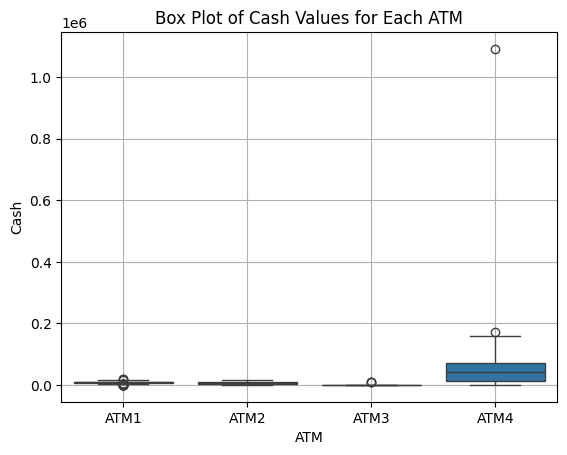

In [ ]:
sns.boxplot(data=df_atm, x='ATM', y='Cash')
plt.title('Box Plot of Cash Values for Each ATM')
plt.xlabel('ATM')
plt.ylabel('Cash')
plt.grid(True)
plt.show()


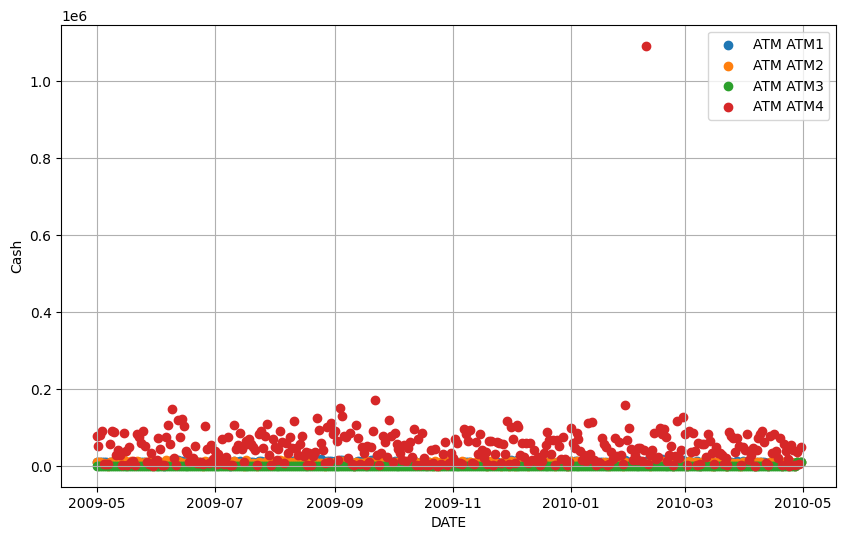

In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

for atm, data in df_atm.groupby('ATM'):
    ax.scatter(data['DATE'], data['Cash'], label=f'ATM {atm}')

# Add labels and legend
ax.set_xlabel('DATE')
ax.set_ylabel('Cash')
ax.legend()

# Show the plot
plt.grid(True)
plt.show()


We cannot drop the Outlier, so instead we will make it as mean of ATM 4.

In [ ]:
df_atm['DATE'] = pd.to_datetime(df_atm['DATE'])
df_atm.loc[df_atm['Cash'] > 1000000, 'Cash'] = np.nan
df_atm[df_atm['DATE'] =="2010-02-09"]


,DATE,ATM,Cash
568,2010-02-09,ATM1,12300.0
569,2010-02-09,ATM2,4500.0
1028,2010-02-09,ATM3,0.0
1393,2010-02-09,ATM4,NaN


In [ ]:
df_atm.groupby('ATM').describe()

Cash                                                                \
      count          mean           std    min      25%      50%      75%   
ATM                                                                         
ATM1  362.0   8388.674033   3665.653855  100.0   7300.0   9100.0  10800.0   
ATM2  363.0   6257.851240   3889.845515    0.0   2550.0   6700.0   9300.0   
ATM3  365.0     72.054795    794.477779    0.0      0.0      0.0      0.0   
ATM4  364.0  44531.593407  35138.459958  200.0  12375.0  40350.0  70425.0   

                
           max  
ATM             
ATM1   18000.0  
ATM2   14700.0  
ATM3    9600.0  
ATM4  171200.0

In [ ]:
group_means = df_atm.groupby('ATM')['Cash'].mean()

# Step 3: Replace the null values with the calculated means for each group
for atm, mean in group_means.items():
    df_atm.loc[(df_atm['ATM'] == atm) & df_atm['Cash'].isnull(), 'Cash'] = mean


In [ ]:
df_atm[df_atm['DATE'] =='2010-02-09']

,DATE,ATM,Cash
568,2010-02-09,ATM1,12300.000000
569,2010-02-09,ATM2,4500.000000
1028,2010-02-09,ATM3,0.000000
1393,2010-02-09,ATM4,44531.593407


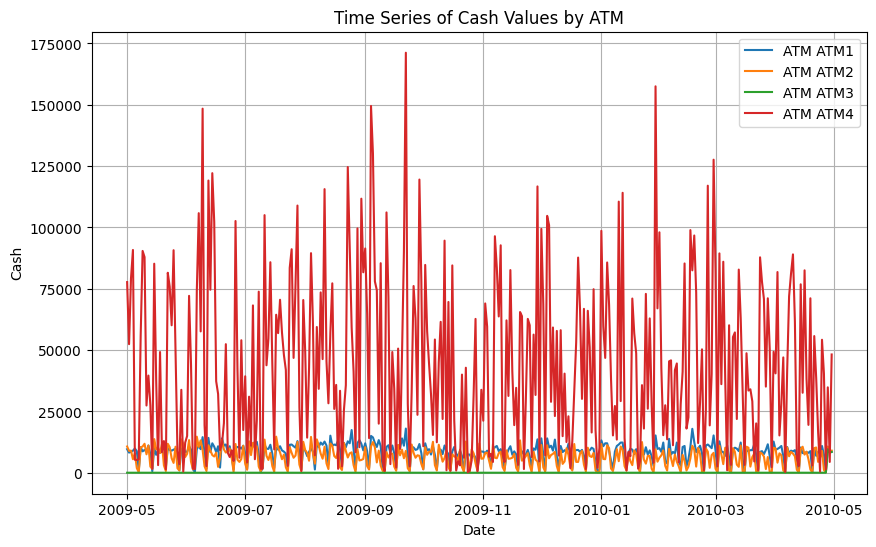

In [ ]:
# Group the DataFrame by 'ATM'
grouped = df_atm.groupby('ATM')

# Plot time series lines for each ATM
plt.figure(figsize=(10, 6))
for atm, group_data in grouped:
    plt.plot(group_data['DATE'], group_data['Cash'], label=f'ATM {atm}')

plt.title('Time Series of Cash Values by ATM')
plt.xlabel('Date')
plt.ylabel('Cash')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
df_atm1=df_atm[df_atm['ATM']=='ATM1']
df_atm2=df_atm[df_atm['ATM']=='ATM2']
df_atm3=df_atm[df_atm['ATM']=='ATM3']
df_atm4=df_atm[df_atm['ATM']=='ATM4']

## STL

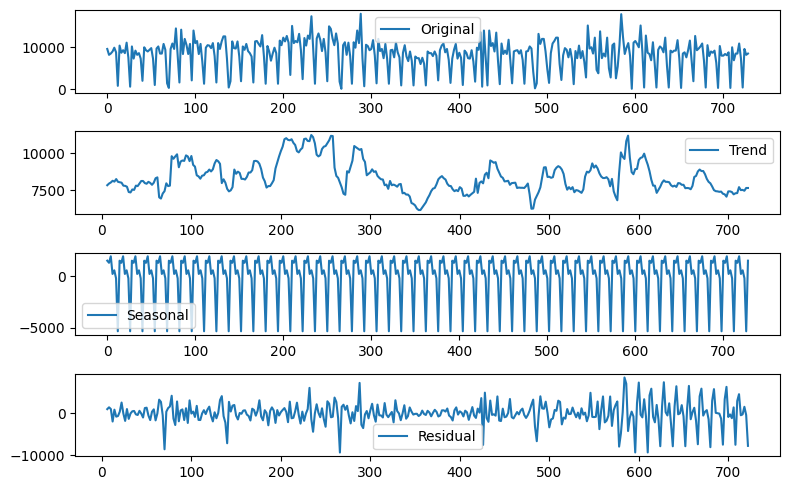

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

frequency = 12  # For example, if data is monthly, set frequency to 12

decomposition = seasonal_decompose(df_atm1['Cash'], model='additive', period=7)
decomposition

plt.figure(figsize=(8, 5))

plt.subplot(411)
plt.plot(df_atm1['Cash'], label='Original')
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label='Residual')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
df_atm1

,DATE,ATM,Cash
0,2009-05-01,ATM1,9600.0
2,2009-05-02,ATM1,8200.0
4,2009-05-03,ATM1,8500.0
6,2009-05-04,ATM1,9000.0
8,2009-05-05,ATM1,9900.0
...,...,...,...
720,2010-04-26,ATM1,7400.0
722,2010-04-27,ATM1,400.0
724,2010-04-28,ATM1,9600.0
726,2010-04-29,ATM1,8200.0


<ipython-input-19-f4d1abea455e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm1['Lag_7'] = df_atm1['Cash'].shift(7)


Fold 1 MAE: 900.00


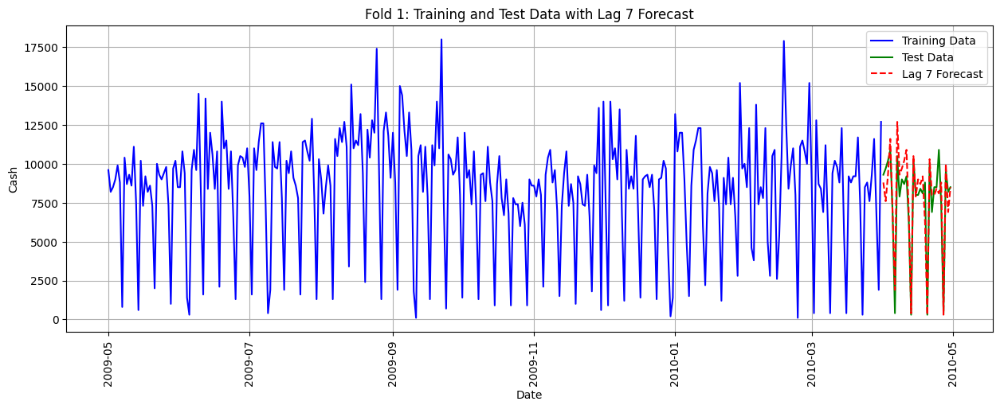



Fold 2 MAE: 1366.67


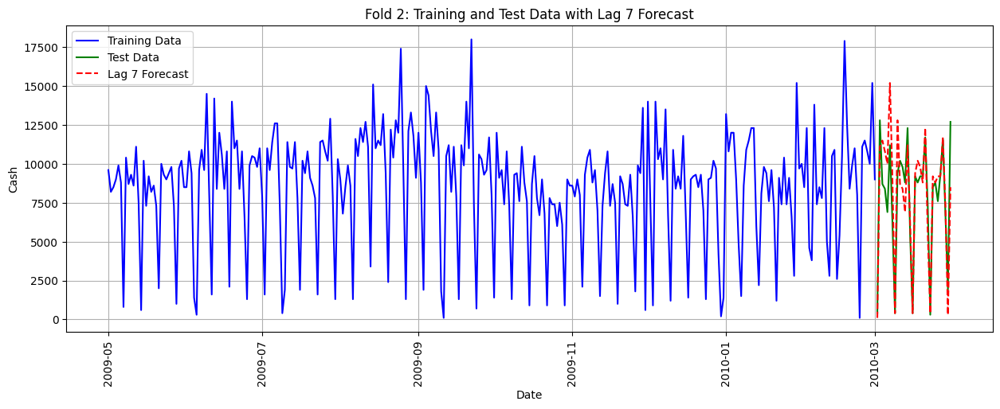



Fold 3 MAE: 3150.00


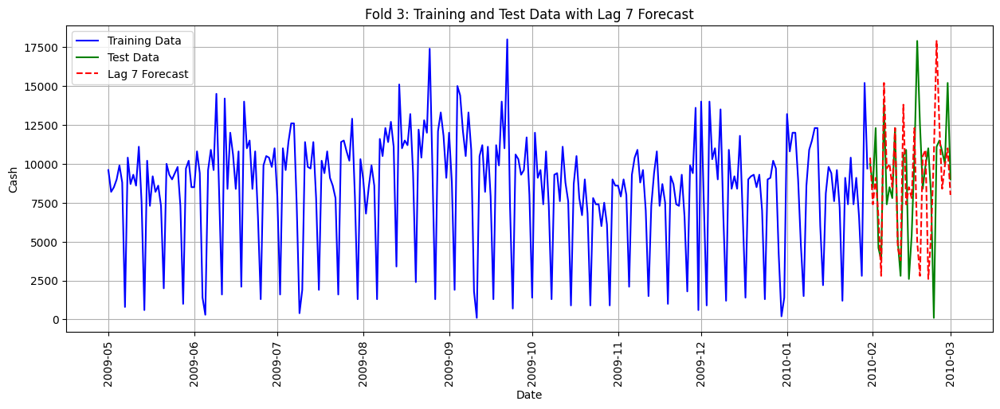



Fold 4 MAE: 1973.33


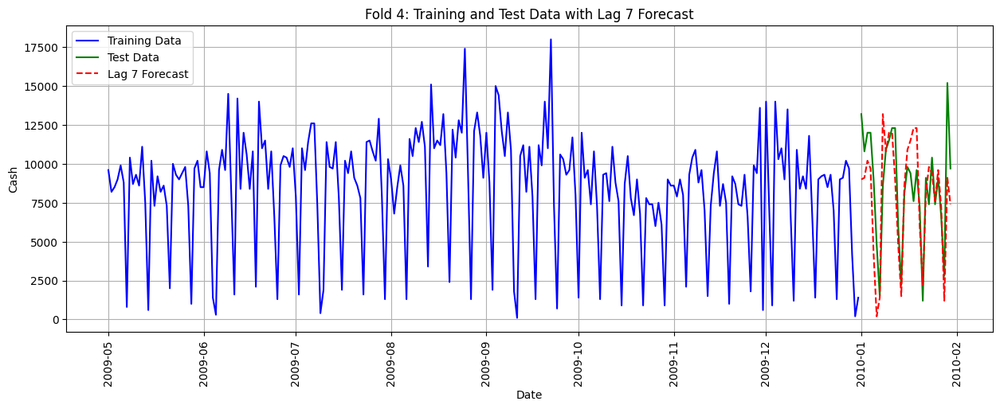



Fold 5 MAE: 1610.00


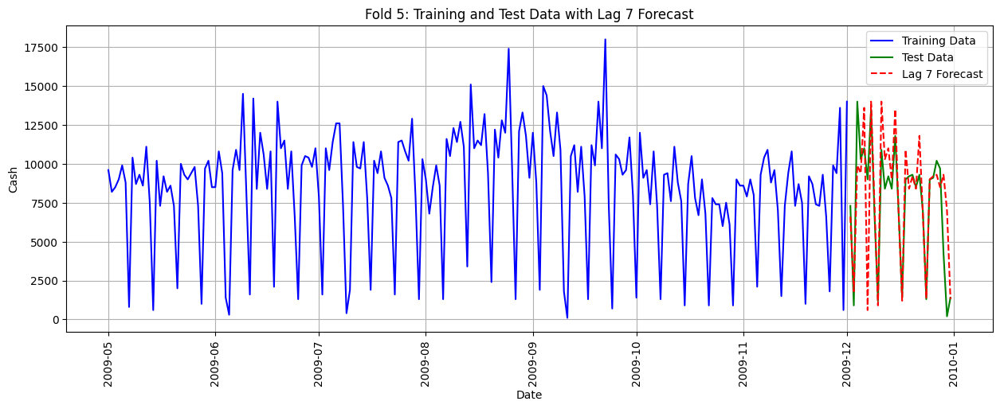



Fold 6 MAE: 1593.33


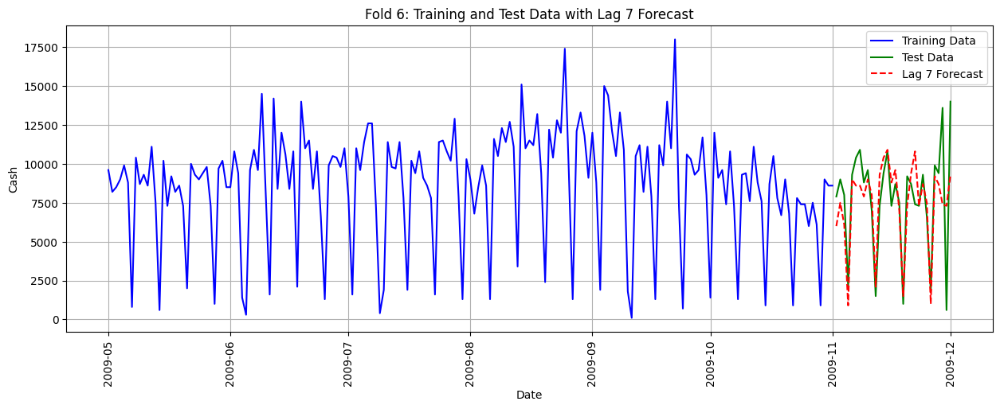



Fold 7 MAE: 1166.67


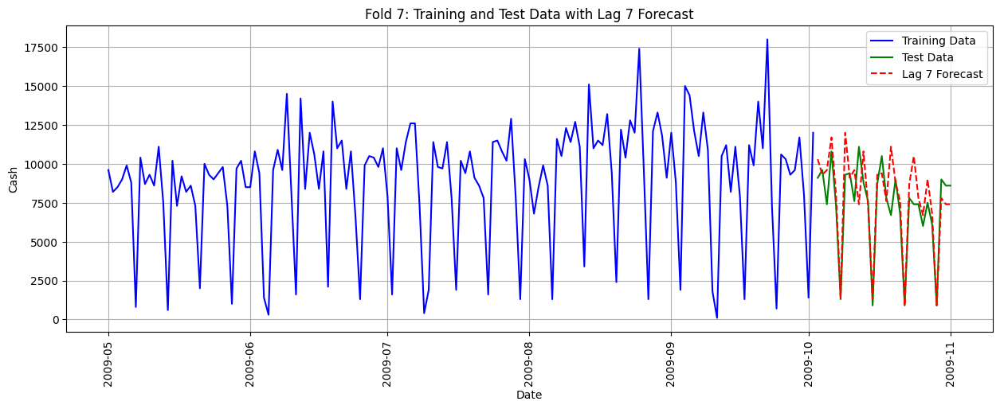



Fold 8 MAE: 2636.67


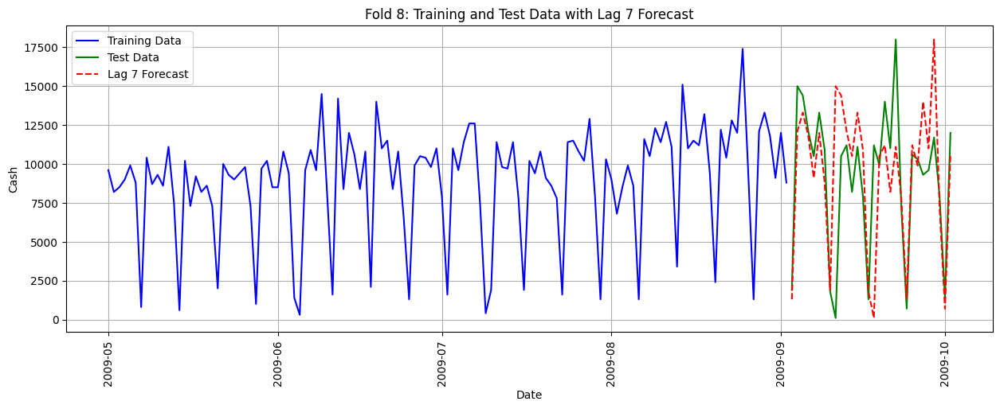



Total Average MAE: 1799.58


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have your data stored in a DataFrame named 'data'
# Replace this with your actual data loading process
df_atm1['Lag_7'] = df_atm1['Cash'].shift(7)
# Number of days for training and testing
n_train_days = len(df_atm1) - 30  # Training data excludes the last 30 days
n_test_days = 30

# List to store the generated DataFrames
dfs = []

# Loop to create eight DataFrames
for i in range(8):
    # Extract training and testing data
    train_data = df_atm1.iloc[:n_train_days]
    test_data = df_atm1.iloc[n_train_days:n_train_days + n_test_days]

    # Append the current fold to the list of DataFrames
    dfs.append((train_data, test_data))

    # Update n_train_days for the next fold
    n_train_days -= n_test_days



# Initialize total MAE
total_mae = 0

for i, (train_data, test_data) in enumerate(dfs, 1):
    # Calculate MAE
    mae = mean_absolute_error(test_data['Cash'], test_data['Lag_7'])

    # Add current fold MAE to total MAE
    total_mae += mae

    # Output results with two decimal places
    print(f"Fold {i} MAE: {mae:.2f}")

    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['DATE'], train_data['Cash'], label='Training Data', color='blue')

    # Plot test data
    plt.plot(test_data['DATE'], test_data['Cash'], label='Test Data', color='green')

    # Plot lagged values (forecast) in the test data
    plt.plot(test_data['DATE'], test_data['Lag_7'], label='Lag 7 Forecast', linestyle='--', color='red')

    plt.xlabel('Date')
    plt.ylabel('Cash')
    plt.title(f'Fold {i}: Training and Test Data with Lag 7 Forecast')
    plt.legend()
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()
    print("\n" + "="*40 + "\n")

# Calculate average MAE
average_mae = total_mae / len(dfs)

# Output total average MAE with two decimal places
print(f"Total Average MAE: {average_mae:.2f}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error

def split_data(df, n_train_days, n_test_days):
    """
    Split the data into training and testing sets.

    Args:
    - df: DataFrame containing the data
    - n_train_days: Number of days for training
    - n_test_days: Number of days for testing

    Returns:
    - List of tuples, each containing training and testing DataFrames
    """
    dfs = []
    for i in range(8):
        train_data = df.iloc[:n_train_days]
        test_data = df.iloc[n_train_days:n_train_days + n_test_days]
        dfs.append((train_data, test_data))
        n_train_days -= n_test_days -23
    return dfs

def calculate_mae(predictions, actual):
    """
    Calculate the mean absolute error (MAE).

    Args:
    - predictions: Array of predicted values
    - actual: Array of actual values

    Returns:
    - MAE
    """
    return mean_absolute_error(actual, predictions)

def plot_actual_vs_predicted(train_data, test_data, predictions, fold_num):
    """
    Plot the actual vs predicted values.

    Args:
    - train_data: DataFrame containing training data
    - test_data: DataFrame containing testing data
    - predictions: Array of predicted values
    - fold_num: Fold number
    """
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['DATE'], train_data['Cash'], label='Training Data', color='blue')
    plt.plot(test_data['DATE'], test_data['Cash'], label='Test Data', color='green')
    plt.plot(test_data['DATE'], predictions, label='Predictions', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Cash')
    plt.title(f'Fold {fold_num}: Actual vs Predicted')
    plt.xticks(rotation=90)
    plt.legend()
    plt.grid(True)
    plt.show()

def calculate_mae_and_plot(dfs, forecast_function):
    """
    Calculate MAE for each fold and plot actual vs predicted values.

    Args:
    - dfs: List of tuples, each containing training and testing DataFrames
    - forecast_function: Function to generate predictions

    Returns:
    - Total average MAE
    """
    total_mae = 0

    for i, (train_data, test_data) in enumerate(dfs, 1):
        predictions = forecast_function(train_data, test_data)
        mae = calculate_mae(predictions, test_data['Cash'])
        total_mae += mae
        print(f"Fold {i} MAE: {mae:.2f}")
        plot_actual_vs_predicted(train_data, test_data, predictions, i)
        print("\n" + "="*40 + "\n")

    average_mae = total_mae / len(dfs)
    print(f"Total Average MAE: {average_mae:.2f}")


In [ ]:
def exponential_smoothing_forecast(train, test, alpha=0.2):

    # Initialize predictions with the last observed value from training data
    predictions = [train['Cash'].iloc[-1]]

    # Apply exponential smoothing for each observation in the test data
    for i in range(len(test)):
        next_pred = alpha * test['Cash'].iloc[i] + (1 - alpha) * predictions[-1]
        predictions.append(next_pred)

    return predictions[1:]  # Exclude the initial value used for initialization


Fold 1 MAE: 1973.57


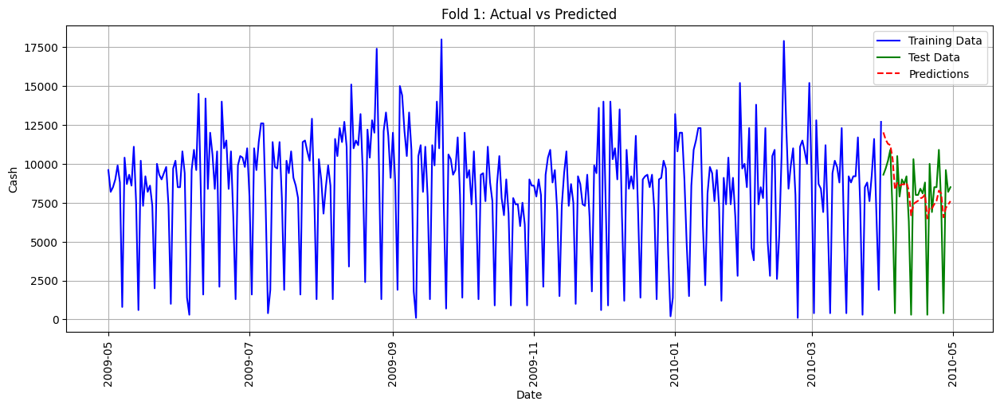



Fold 2 MAE: 1931.67


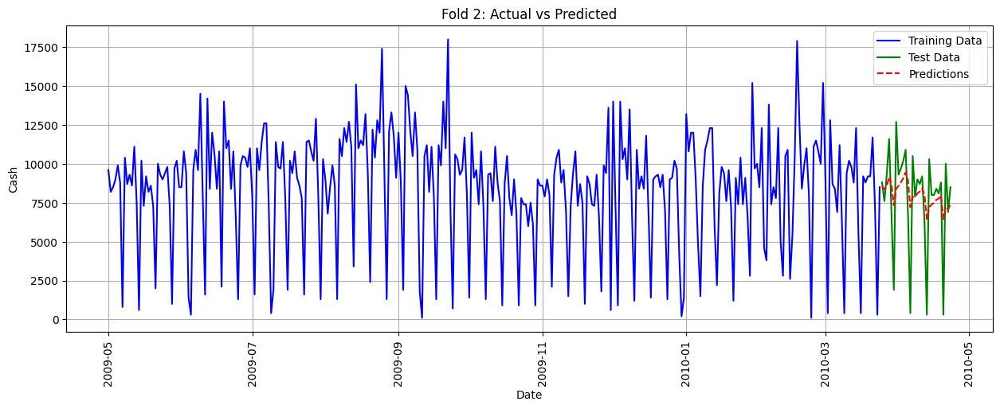



Fold 3 MAE: 1972.38


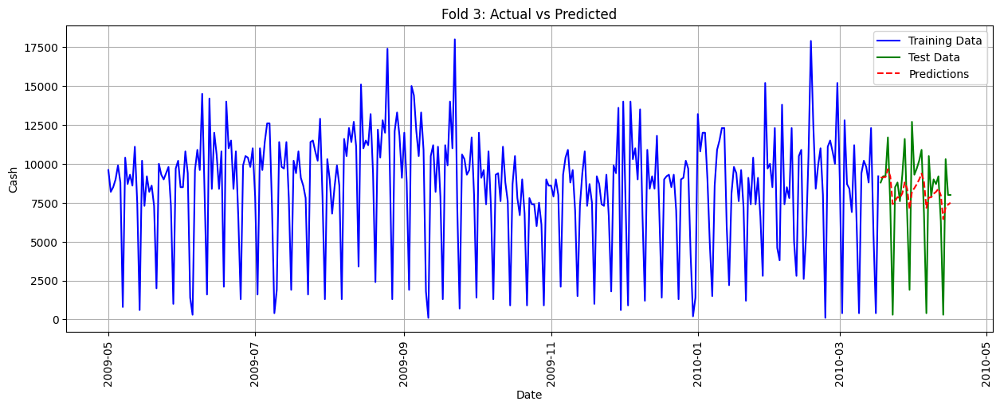



Fold 4 MAE: 2142.23


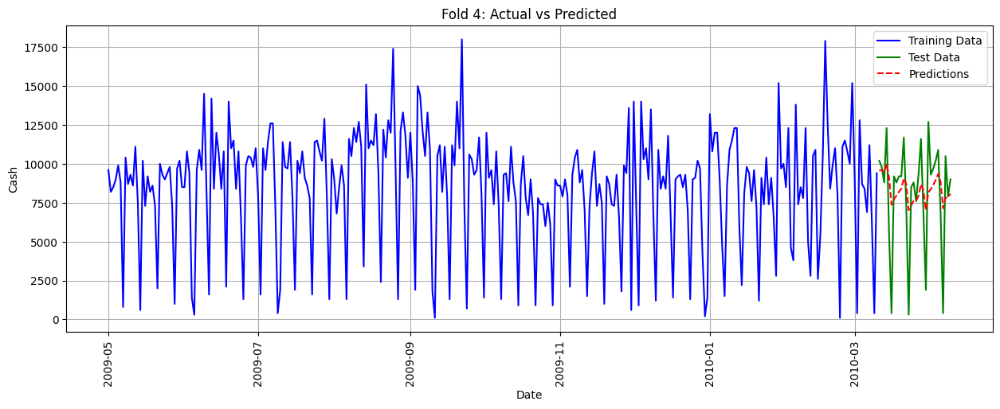



Fold 5 MAE: 2443.00


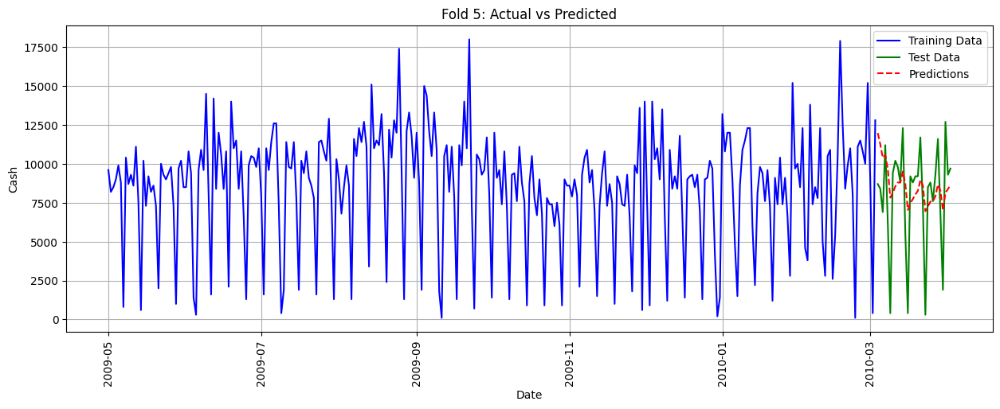



Fold 6 MAE: 2347.04


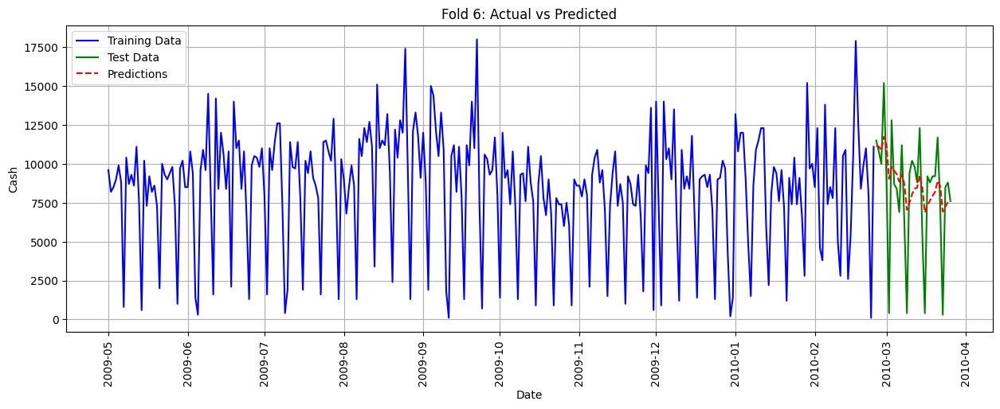



Fold 7 MAE: 2967.32


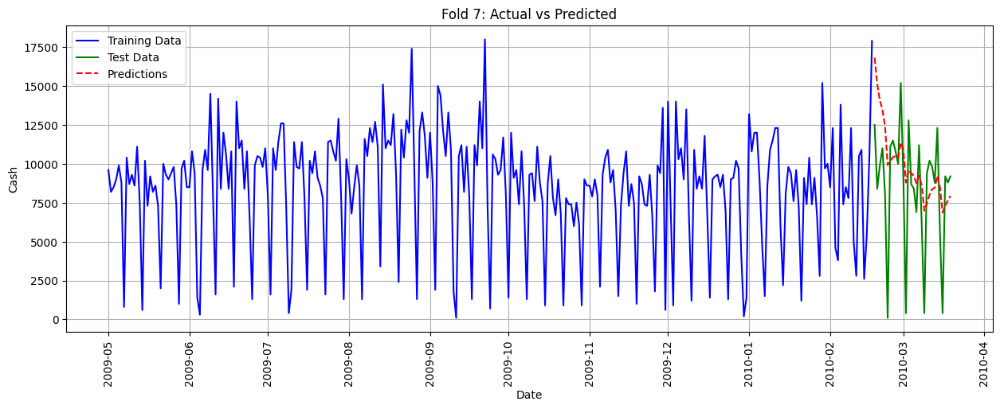



Fold 8 MAE: 2848.56


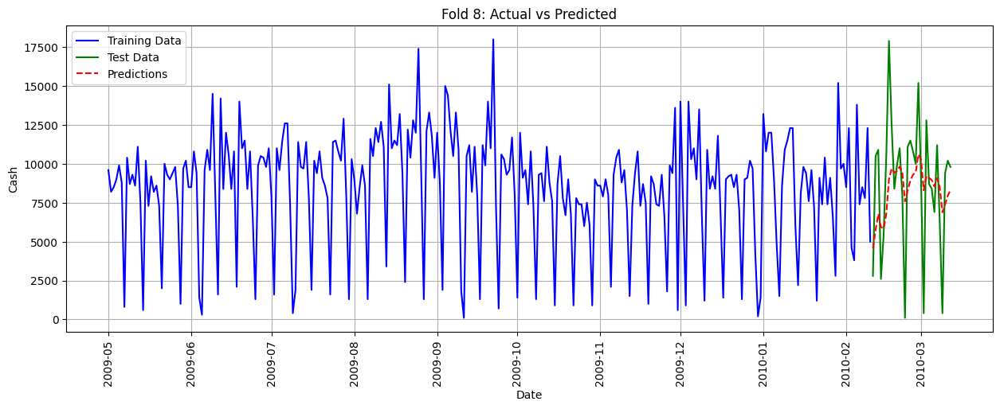



Total Average MAE: 2328.22


In [ ]:
n_train_days = len(df_atm1) - 30
n_test_days = 30

dfs = split_data(df_atm1, n_train_days, n_test_days)
calculate_mae_and_plot(dfs, exponential_smoothing_forecast)

In [ ]:
df_atm1

,DATE,ATM,Cash,Lag_7
0,2009-05-01,ATM1,9600.0,NaN
2,2009-05-02,ATM1,8200.0,NaN
4,2009-05-03,ATM1,8500.0,NaN
6,2009-05-04,ATM1,9000.0,NaN
8,2009-05-05,ATM1,9900.0,NaN
...,...,...,...,...
720,2010-04-26,ATM1,7400.0,8800.0
722,2010-04-27,ATM1,400.0,300.0
724,2010-04-28,ATM1,9600.0,10000.0
726,2010-04-29,ATM1,8200.0,6900.0


In [ ]:
df_atm_ses=df_atm1

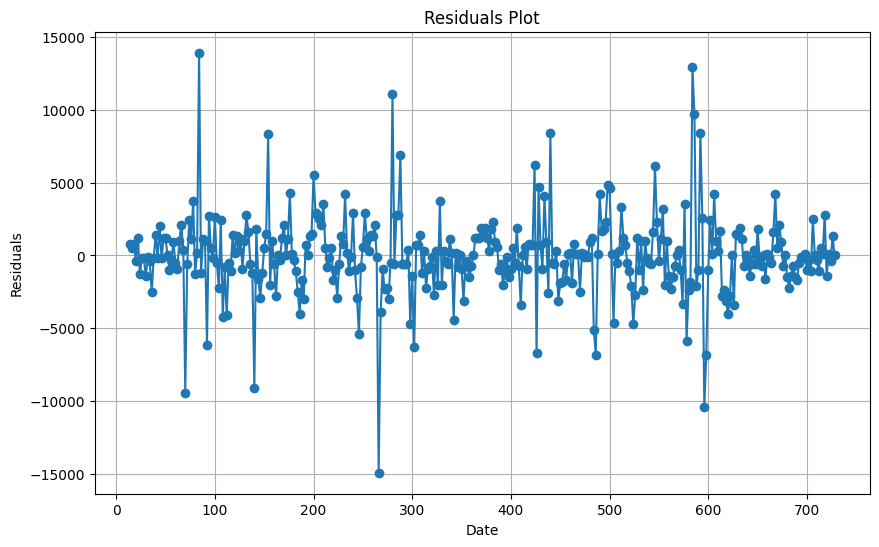

In [ ]:
residuals = df_atm1['Cash'] - df_atm1['Lag_7']
plt.figure(figsize=(10, 6))
plt.plot(df_atm1.index, residuals, marker='o', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


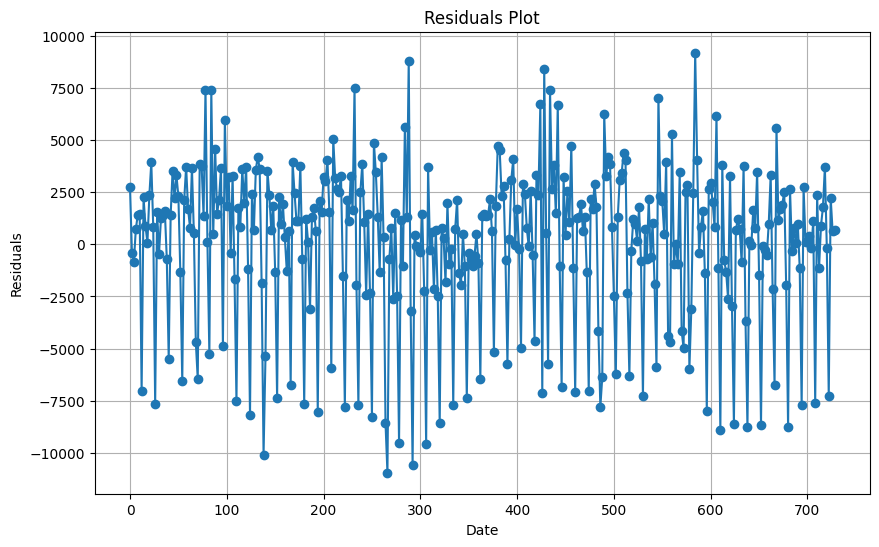

In [ ]:
# Fit Holt-Winters Exponential Smoothing model with manual initialization
model_holt_winters = sm.tsa.ExponentialSmoothing(df_atm_ses['Cash'], trend='add', seasonal='add', seasonal_periods=12)
results = model_holt_winters.fit()
residuals = df_atm1['Cash'] - results.fittedvalues
plt.figure(figsize=(10, 6))
plt.plot(df_atm1.index, residuals, marker='o', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.grid(True)
plt.show()

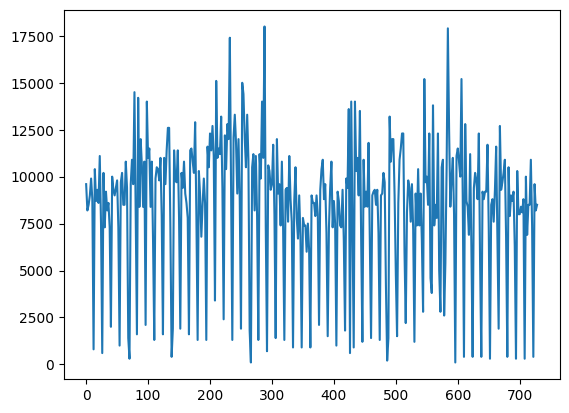

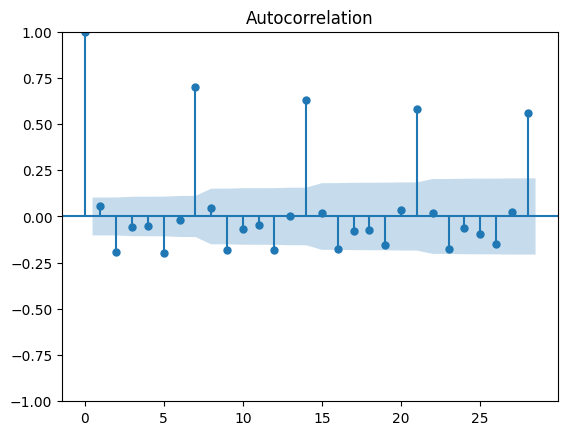

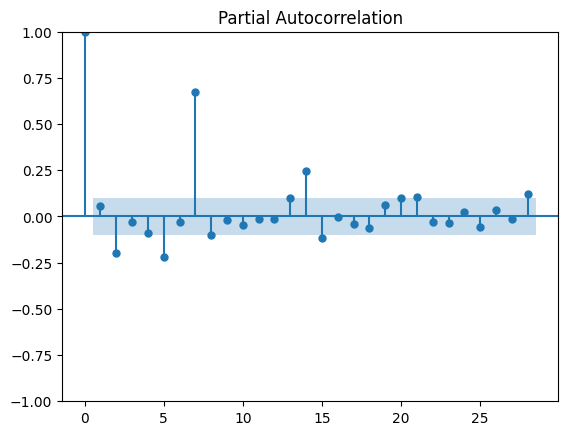

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.plot(df_atm1['Cash'])
# Plot ACF and PACF
plot_acf(df_atm1['Cash'], lags=28)
plt.show()

plot_pacf(df_atm1['Cash'], lags=28)
plt.show()


The ACF graph shows weekly seasonality, with large spikes in lags 7, 14 and 21 , and the Spectrum plot shows the frequencies 1, 2, 3. This is suggestive of seasonal ARIMA model.being a significant lag. The ACF seems to be decreasing relatively slowly which could be an indicator that the data is non-stationary and could potentially benefit from differencing.

In [ ]:
pip install pmdarima

In [ ]:
from pmdarima.arima.utils import ndiffs

n_diffs = ndiffs(df_atm1['Cash'])

print("Number of differences needed:", n_diffs)


Number of differences needed: 0


No differencing is required.

In [ ]:
import itertools

def ARIMA_eval_aic(params):
    p, d, q = params
    try:
        model = ARIMA(df_atm1['Cash'], order=(p, d, q))
        results = model.fit()
        return results.aic
    except:
        return None

# Define the ranges for p, d, and q
p_range = range(0, 3)
d_range = range(0, 3)
q_range = range(0, 3)

# Generate all possible combinations of p, d, and q
param_grid = itertools.product(p_range, d_range, q_range)

# Filter out combinations where p, d, and q are not all greater than 0
param_grid_filtered = [(p, d, q) for (p, d, q) in param_grid if (p > 0 or d > 0 or q > 0)]

# Calculate AIC for each combination
aic_values = {}
for params in param_grid_filtered:
    aic_values[params] = ARIMA_eval_aic(params)

# Print all AIC values
for params, aic in aic_values.items():
    print(f"({params}): AIC = {aic}")


((0, 0, 1)): AIC = None
((0, 0, 2)): AIC = None
((0, 1, 0)): AIC = None
((0, 1, 1)): AIC = None
((0, 1, 2)): AIC = None
((0, 2, 0)): AIC = None
((0, 2, 1)): AIC = None
((0, 2, 2)): AIC = None
((1, 0, 0)): AIC = None
((1, 0, 1)): AIC = None
((1, 0, 2)): AIC = None
((1, 1, 0)): AIC = None
((1, 1, 1)): AIC = None
((1, 1, 2)): AIC = None
((1, 2, 0)): AIC = None
((1, 2, 1)): AIC = None
((1, 2, 2)): AIC = None
((2, 0, 0)): AIC = None
((2, 0, 1)): AIC = None
((2, 0, 2)): AIC = None
((2, 1, 0)): AIC = None
((2, 1, 1)): AIC = None
((2, 1, 2)): AIC = None
((2, 2, 0)): AIC = None
((2, 2, 1)): AIC = None
((2, 2, 2)): AIC = None


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox

# Fit ARIMA model
model_arima = ARIMA(df_atm1['Cash'], order=(1, 0, 1), seasonal_order=(0, 0, 0, 7))


results = model_arima.fit()

# Get the residuals of the fitted ARIMA model
residuals = results.resid

sm.stats.acorr_ljungbox(residuals, lags=[7], return_df=True)





/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


,lb_stat,lb_pvalue
7,177.359006,7.034602e-35


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Cash   No. Observations:                  365
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -3501.711
Date:                Tue, 26 Mar 2024   AIC                           7011.422
Time:                        02:53:04   BIC                           7027.022
Sample:                             0   HQIC                          7017.621
                                - 365                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8388.6741    252.157     33.268      0.000    7894.456    8882.892
ar.L1         -0.7308      0.092     -7.947      0.000      -0.911      -0.551
ma.L1          0.8930      0.058     15.340      0.000       0.779       1.007
sigma2      1.338e+07      0.012   1.12e+09      0.000    1.34e+07    1.34e+07
===================================================================================
Ljung-Box (L1) (Q):                   0.90   Jarque-Bera (JB):                 8.24
Prob(Q):                              0.34   Prob(JB):                         0.02
Heteroskedasticity (H):               0.99   Skew:                            -0.37
Prob(H) (two-sided):                  0.94   Kurtosis:                         3.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.2e+25. Standard errors may be unstable.
"""

In the context of the Ljung-Box test, The p-value represents the probability of observing the test statistic (or more extreme) under the null hypothesis. In this case, a very small p-value like 7.13 e-35 indicates strong evidence against the null hypothesis, suggesting that the data are not random or exhibit some form of autocorrelation up to the specified lag.

In [ ]:
df_atm1.reset_index(drop=True, inplace=True)
df_atm1

,DATE,ATM,Cash,Lag_7
0,2009-05-01,ATM1,9600.0,NaN
1,2009-05-02,ATM1,8200.0,NaN
2,2009-05-03,ATM1,8500.0,NaN
3,2009-05-04,ATM1,9000.0,NaN
4,2009-05-05,ATM1,9900.0,NaN
...,...,...,...,...
360,2010-04-26,ATM1,7400.0,8800.0
361,2010-04-27,ATM1,400.0,300.0
362,2010-04-28,ATM1,9600.0,10000.0
363,2010-04-29,ATM1,8200.0,6900.0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error


def split_data(df, n_train_days, n_test_days):
    dfs = []
    for i in range(8):
        train_data = df.iloc[:n_train_days]
        test_data = df.iloc[n_train_days:n_train_days + n_test_days]
        dfs.append((train_data, test_data))
        n_train_days -= n_test_days
    return dfs

def calculate_mae(predictions, actual):
    return mean_absolute_error(actual, predictions)

def plot_actual_vs_predicted(train_data, test_data, predictions, fold_num):
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['DATE'], train_data['Cash'], label='Training Data', color='blue')
    plt.plot(test_data['DATE'], test_data['Cash'], label='Test Data', color='green')
    plt.plot(test_data['DATE'], predictions, label='Predictions', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Cash')
    plt.title(f'Fold {fold_num}: Actual vs Predicted')
    plt.xticks(rotation=90)
    plt.legend()
    plt.grid(True)
    plt.show()

# def calculate_mae_and_plot(dfs, forecast_function):
#     total_mae = 0

#     for i, (train_data, test_data) in enumerate(dfs, 1):
#         predictions = forecast_function(train_data, test_data)
#         mae = calculate_mae(predictions, test_data['Cash'])
#         total_mae += mae
#         print(f"Fold {i} MAE: {mae:.2f}")
#         plot_actual_vs_predicted(train_data, test_data, predictions, i)
#         print("\n" + "="*40 + "\n")

#     average_mae = total_mae / len(dfs)
#     print(f"Total Average MAE: {average_mae:.2f}")

def calculate_mae_and_plot(dfs, forecast_function):
    total_mae = 0
    total_mape = 0

    for i, (train_data, test_data) in enumerate(dfs, 1):
        predictions = forecast_function(train_data, test_data)

        # Calculate MAE
        mae = mean_absolute_error(test_data['Cash'], predictions)
        total_mae += mae

        # Calculate absolute error
        absolute_error = np.abs(test_data['Cash'] - predictions)

        # Calculate actual values to avoid division by zero
        actual_values = test_data['Cash'].replace(0, 1)  # Replace zeros with ones to avoid division by zero

        # Calculate percentage error
        percentage_error = (absolute_error / actual_values) * 100

        # Calculate MAPE
        mape = percentage_error.mean()
        total_mape += mape

        # Output results with two decimal places
        print(f"Fold {i} MAE: {mae:.2f}, MAPE: {mape:.2f}%")

        # Plot actual vs predicted
        plot_actual_vs_predicted(train_data, test_data, predictions, i)

    # Calculate average MAE and MAPE
    average_mae = total_mae / len(dfs)
    average_mape = total_mape / len(dfs)

    # Output total average MAE and MAPE with two decimal places
    print(f"Total Average MAE: {average_mae:.2f}")
    print(f"Total Average MAPE: {average_mape:.2f}%")


Fold 1 MAE: 973.86, MAPE: 62.31%


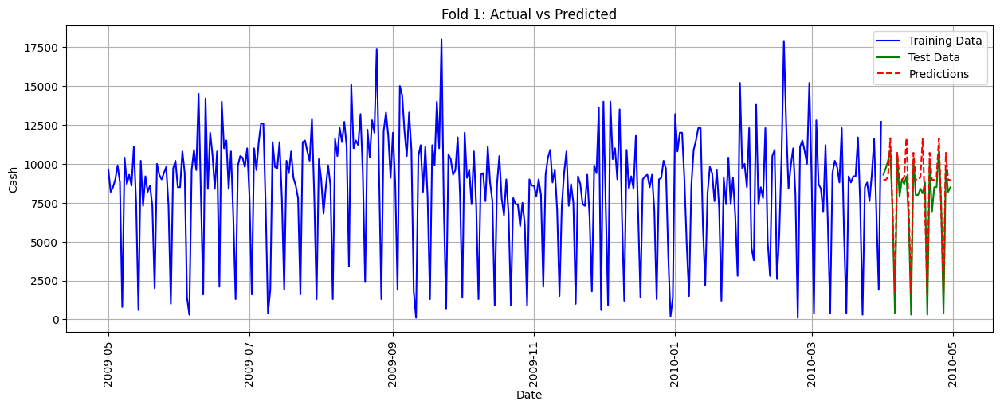

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Fold 2 MAE: 3762.74, MAPE: 424.46%


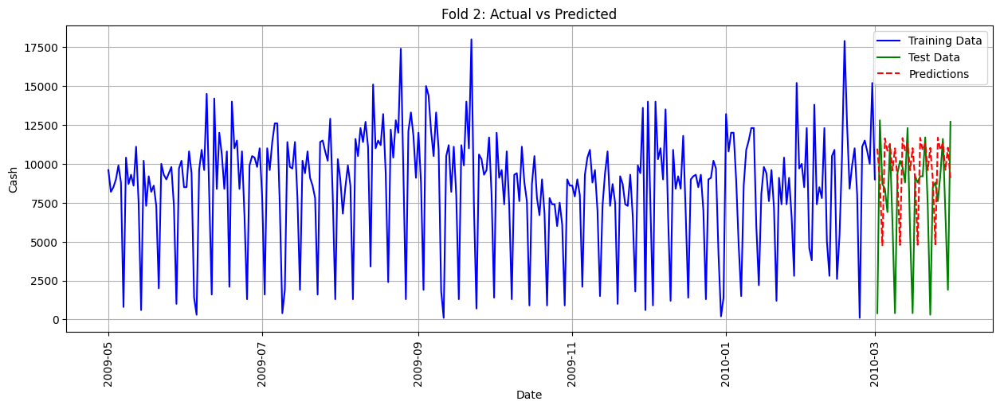

Fold 3 MAE: 3001.26, MAPE: 402.44%


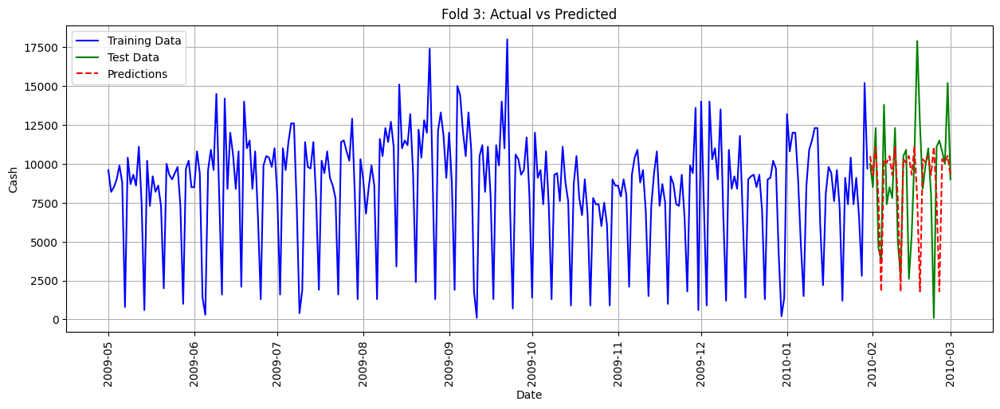

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Fold 4 MAE: 2260.88, MAPE: 35.66%


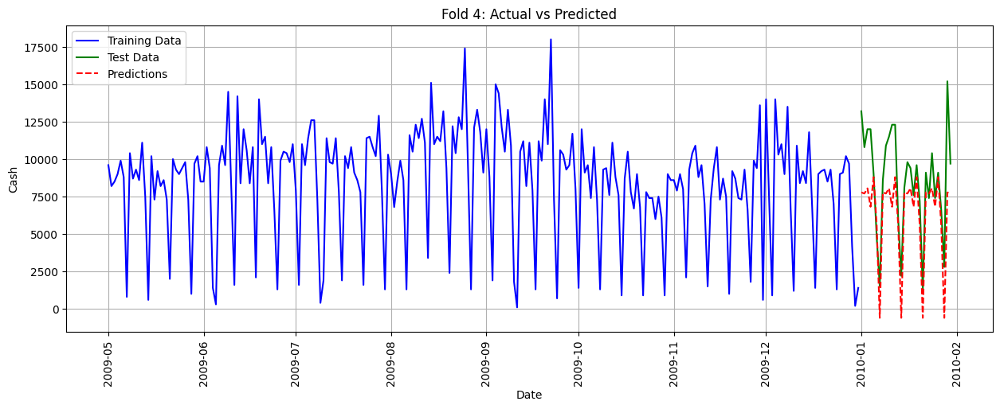

Fold 5 MAE: 1233.57, MAPE: 135.56%


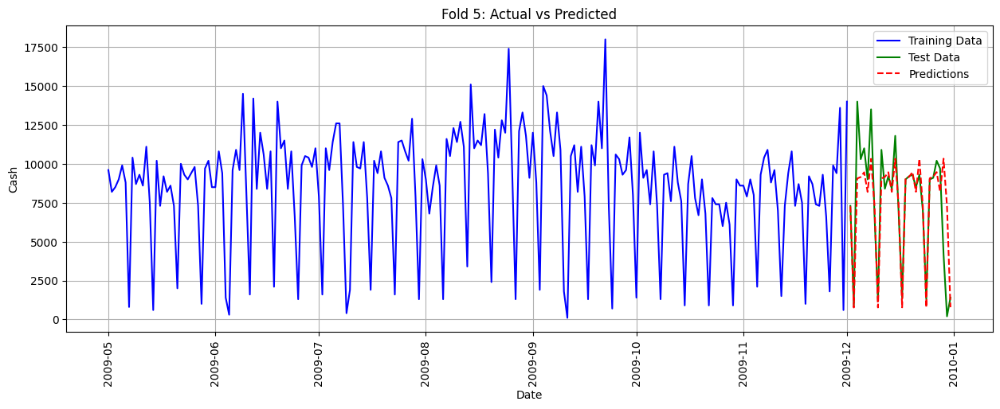

Fold 6 MAE: 1541.44, MAPE: 65.09%


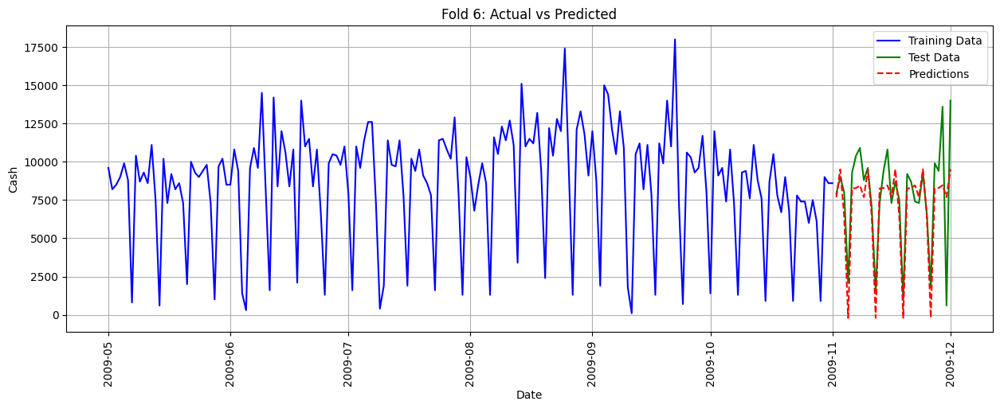

Fold 7 MAE: 2265.47, MAPE: 43.60%


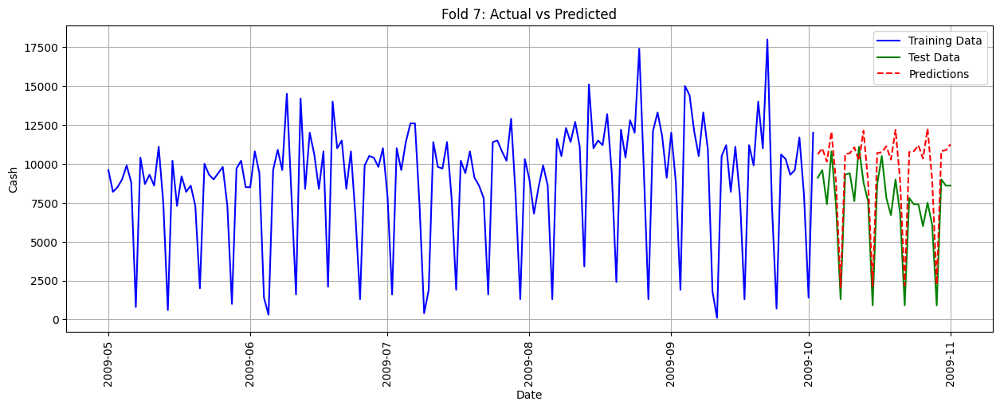

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Fold 8 MAE: 1845.05, MAPE: 412.22%


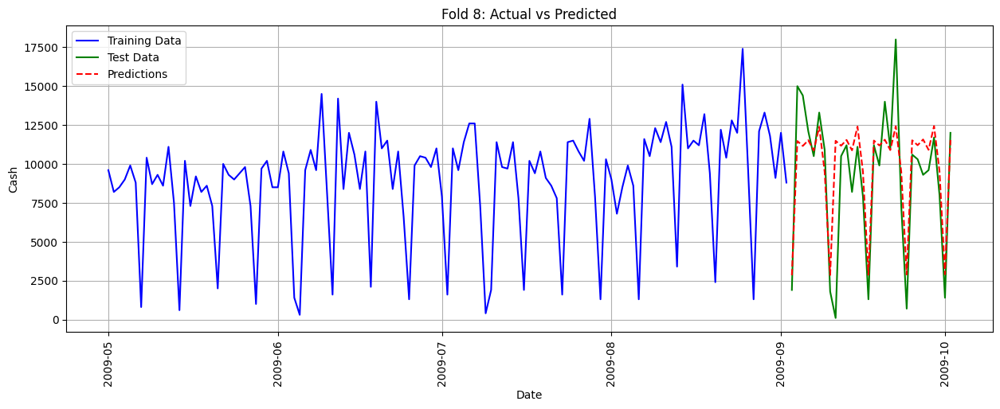

Total Average MAE: 2110.53
Total Average MAPE: 197.67%


In [ ]:
def arima_forecast(train_data, test_data):
    # Fit ARIMA model
    model = ARIMA(train_data['Cash'], order=(1, 0, 1), seasonal_order=(0, 1, 1, 7))  # You may need to adjust the order
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=len(test_data))

    return forecast

n_train_days = len(df_atm1) - 30
n_test_days = 30

dfs = split_data(df_atm1, n_train_days, n_test_days)
calculate_mae_and_plot(dfs, arima_forecast)


In [ ]:
# from pmdarima import auto_arima

# def auto_arima_forecast(train_data, test_data):
#     # Fit auto ARIMA model
#     model = auto_arima(train_data['Cash'], seasonal=True, m=7)  # Adjust parameters as needed
#     model_fit = model.fit(train_data['Cash'])

#     # Make predictions
#     forecast = model_fit.predict(n_periods=len(test_data))
#     return forecast

# n_train_days = len(df_atm1) - 30
# n_test_days = 30

# dfs = split_data(df_atm1, n_train_days, n_test_days)
# calculate_mae_and_plot(dfs, auto_arima_forecast)


#### Naive Model : MAE: 18.00
#### Multiple Exponentail Smooting: 23.28
#### Arima order=(1, 0, 1), seasonal_order=(0, 1, 1, 7) : 19.15
#### Arima Auto: 25.13
#### Very interseting results as with CV, the Naive Seasonal outperforms all the other 3 models.

Fold 1 MAE: 1510.00


<ipython-input-37-26ff7e1d37f2>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm2['Lag_7'] = df_atm2['Cash'].shift(7)


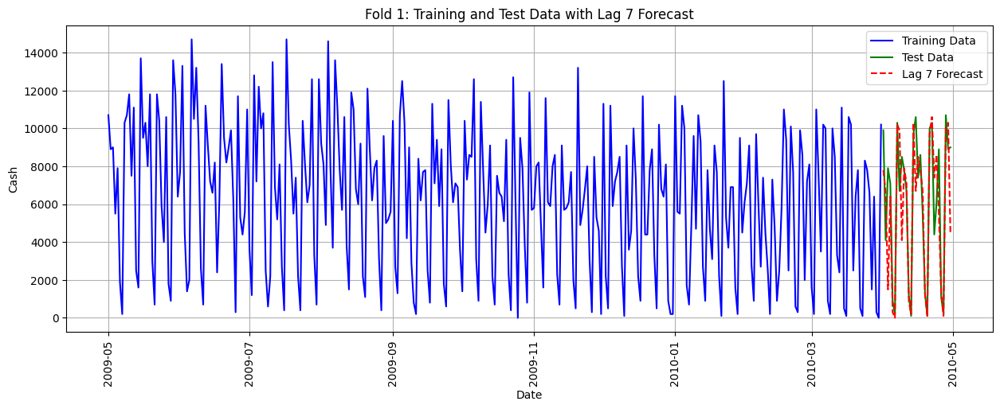



Fold 2 MAE: 1623.33


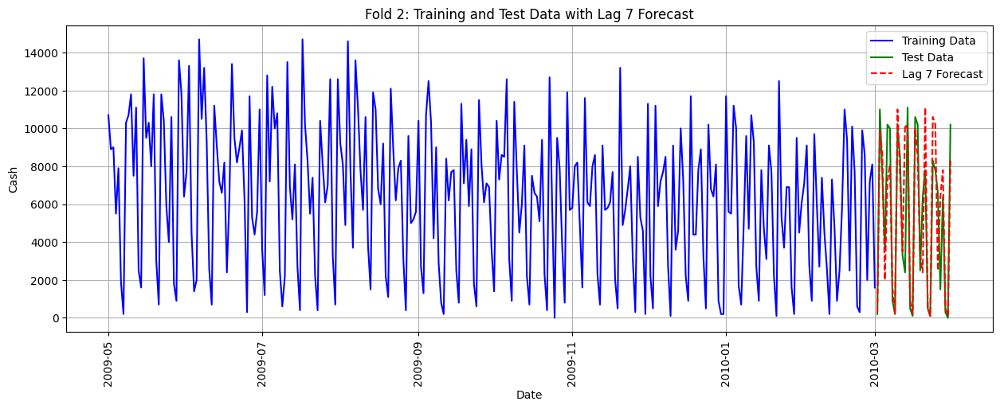



Fold 3 MAE: 2593.33


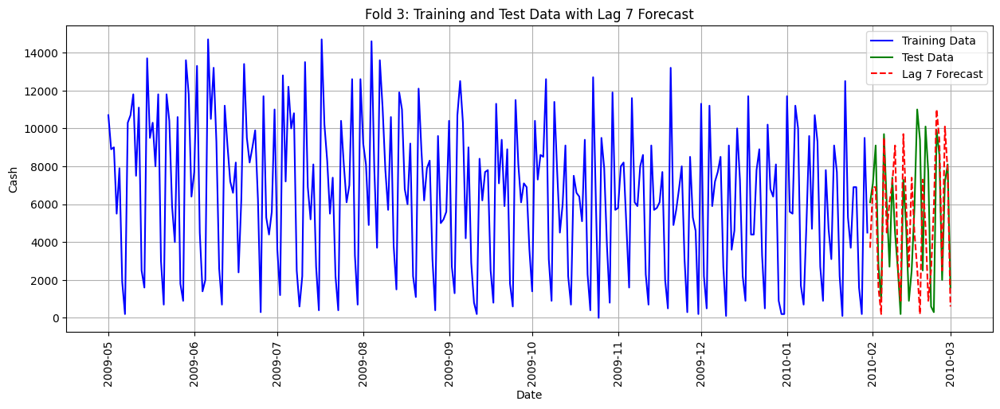



Fold 4 MAE: 1970.00


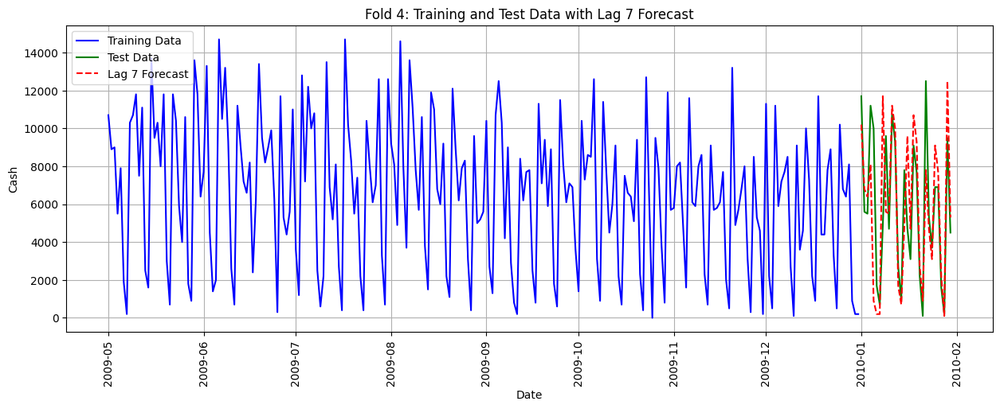



Fold 5 MAE: 1883.33


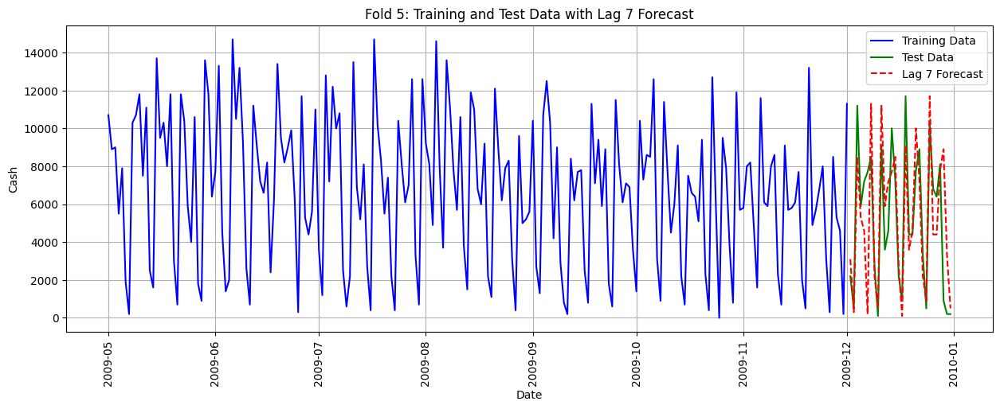



Fold 6 MAE: 1270.00


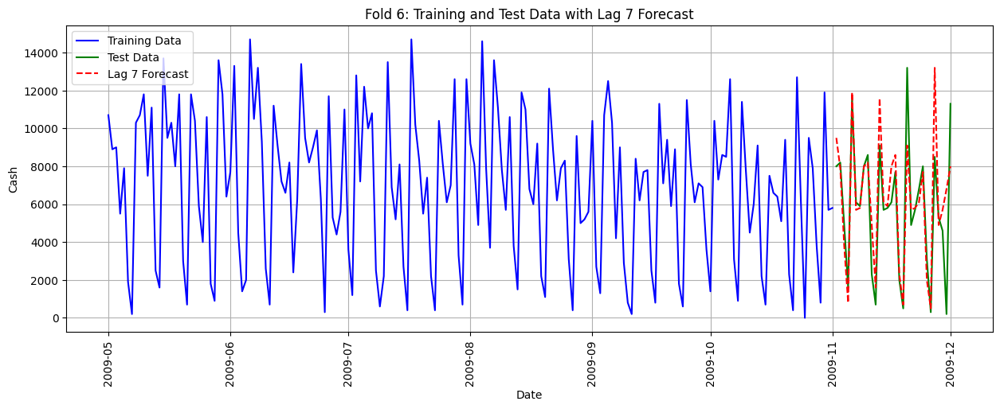



Fold 7 MAE: 1986.67


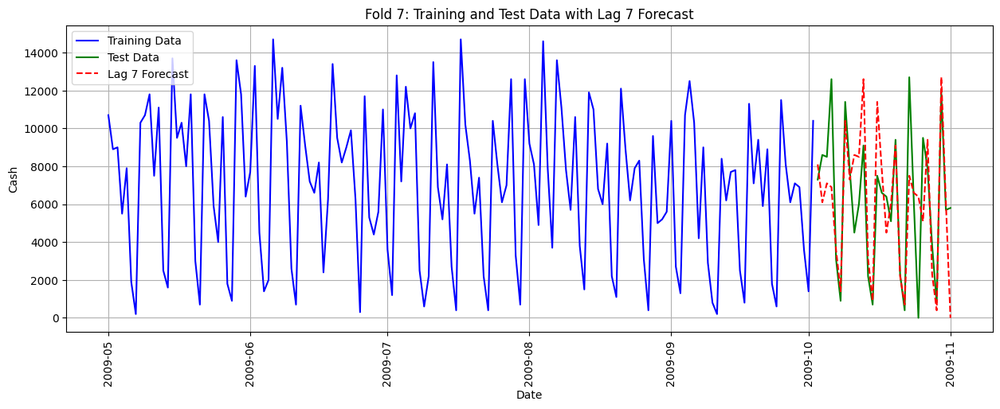



Fold 8 MAE: 2423.33


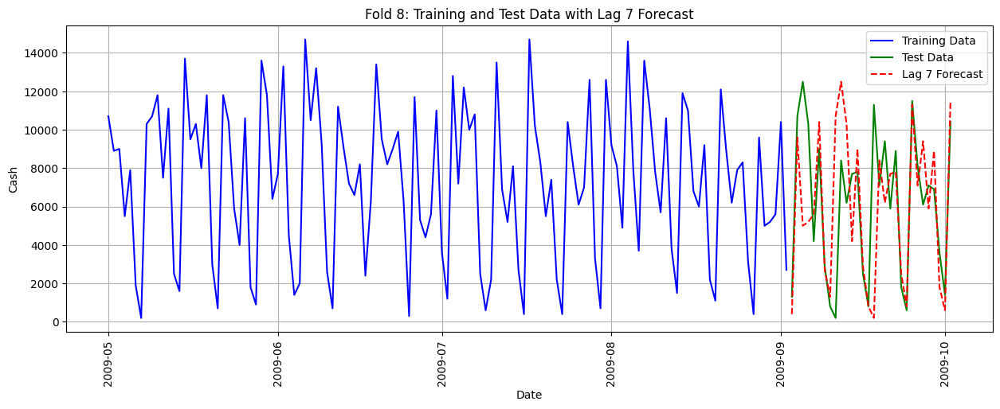



Total Average MAE: 1907.50


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have your data stored in a DataFrame named 'data'
# Replace this with your actual data loading process
df_atm2['Lag_7'] = df_atm2['Cash'].shift(7)
# Number of days for training and testing
n_train_days = len(df_atm2) - 30  # Training data excludes the last 30 days
n_test_days = 30

# List to store the generated DataFrames
dfs = []

# Loop to create eight DataFrames
for i in range(8):
    # Extract training and testing data
    train_data = df_atm2.iloc[:n_train_days]
    test_data = df_atm2.iloc[n_train_days:n_train_days + n_test_days]

    # Append the current fold to the list of DataFrames
    dfs.append((train_data, test_data))

    # Update n_train_days for the next fold
    n_train_days -= n_test_days



# Initialize total MAE
total_mae = 0

for i, (train_data, test_data) in enumerate(dfs, 1):
    # Calculate MAE
    mae = mean_absolute_error(test_data['Cash'], test_data['Lag_7'])

    # Add current fold MAE to total MAE
    total_mae += mae

    # Output results with two decimal places
    print(f"Fold {i} MAE: {mae:.2f}")

    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['DATE'], train_data['Cash'], label='Training Data', color='blue')

    # Plot test data
    plt.plot(test_data['DATE'], test_data['Cash'], label='Test Data', color='green')

    # Plot lagged values (forecast) in the test data
    plt.plot(test_data['DATE'], test_data['Lag_7'], label='Lag 7 Forecast', linestyle='--', color='red')

    plt.xlabel('Date')
    plt.ylabel('Cash')
    plt.title(f'Fold {i}: Training and Test Data with Lag 7 Forecast')
    plt.legend()
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()
    print("\n" + "="*40 + "\n")

# Calculate average MAE
average_mae = total_mae / len(dfs)

# Output total average MAE with two decimal places
print(f"Total Average MAE: {average_mae:.2f}")

In [ ]:
def ARIMA_eval_aic(params):
    p, d, q = params
    try:
        model = ARIMA(df_atm2['Cash'], order=(p, d, q))
        results = model.fit()
        return results.aic
    except:
        return None

# Define the ranges for p, d, and q
p_range = range(0, 3)
d_range = range(0, 3)
q_range = range(0, 3)

# Generate all possible combinations of p, d, and q
param_grid = itertools.product(p_range, d_range, q_range)

# Filter out combinations where p, d, and q are not all greater than 0
param_grid_filtered = [(p, d, q) for (p, d, q) in param_grid if (p > 0 or d > 0 or q > 0)]

# Calculate AIC for each combination
aic_values = {}
for params in param_grid_filtered:
    aic_values[params] = ARIMA_eval_aic(params)

# Print all AIC values
for params, aic in aic_values.items():
    print(f"({params}): AIC = {aic}")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dat

((0, 0, 1)): AIC = 7072.479149258401
((0, 0, 2)): AIC = 7030.7752922804975
((0, 1, 0)): AIC = 7294.231536859783
((0, 1, 1)): AIC = 7056.73378013921
((0, 1, 2)): AIC = 7051.909503872938
((0, 2, 0)): AIC = 7624.289144878512
((0, 2, 1)): AIC = 7283.048654790404
((0, 2, 2)): AIC = 7047.099577463952
((1, 0, 0)): AIC = 7072.916546128884
((1, 0, 1)): AIC = 7057.140870698142
((1, 0, 2)): AIC = 7032.706494128286
((1, 1, 0)): AIC = 7259.85727231332
((1, 1, 1)): AIC = 7051.973170323248
((1, 1, 2)): AIC = 7037.581780852395
((1, 2, 0)): AIC = 7541.476829879665
((1, 2, 1)): AIC = 7254.583920787298
((1, 2, 2)): AIC = 7286.047830309904
((2, 0, 0)): AIC = 7025.749169147757
((2, 0, 1)): AIC = 7023.782004160352
((2, 0, 2)): AIC = 6933.534472973656
((2, 1, 0)): AIC = 7120.463896446559
((2, 1, 1)): AIC = 6990.680933508931
((2, 1, 2)): AIC = 7009.595780419607
((2, 2, 0)): AIC = 7363.56538673785
((2, 2, 1)): AIC = 7111.271296270143
((2, 2, 2)): AIC = 6984.252068294812


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


The lower order AIC is (2,0,2), thats the model we will run with seasonal order of 0,1,1.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

Fold 1 MAE: 1528.70, MAPE: nan%


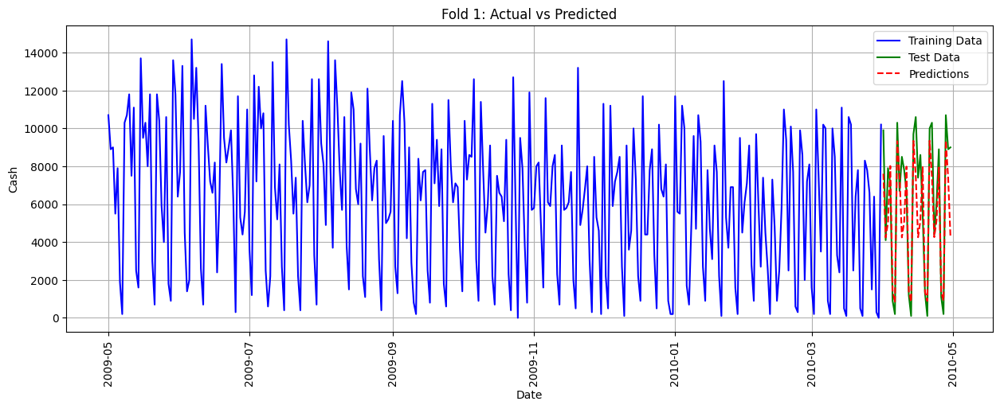

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

Fold 2 MAE: 3651.48, MAPE: nan%


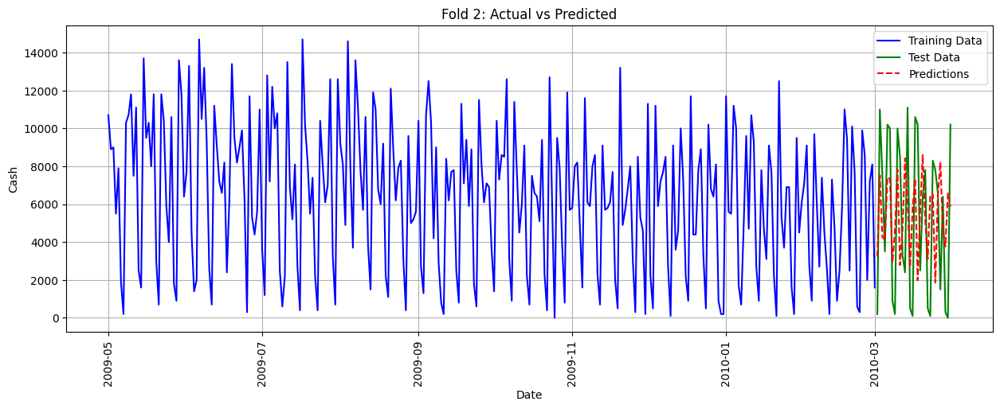

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integ

Fold 3 MAE: 3562.97, MAPE: nan%


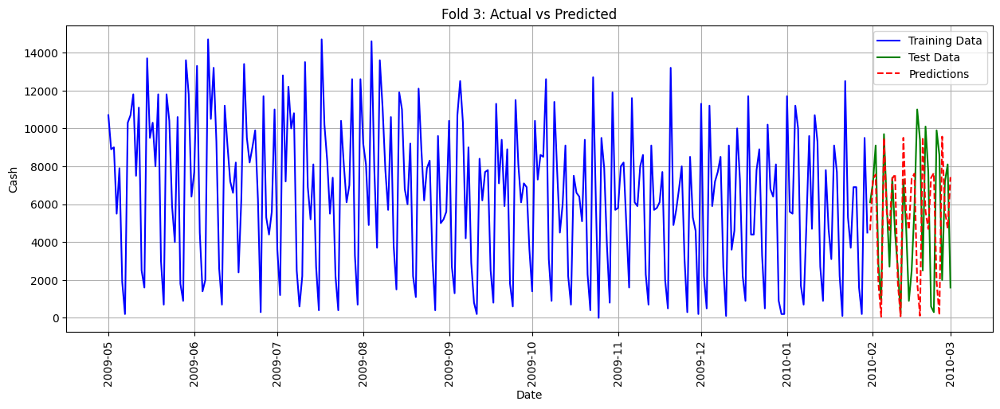

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Che

Fold 4 MAE: 1517.25, MAPE: nan%


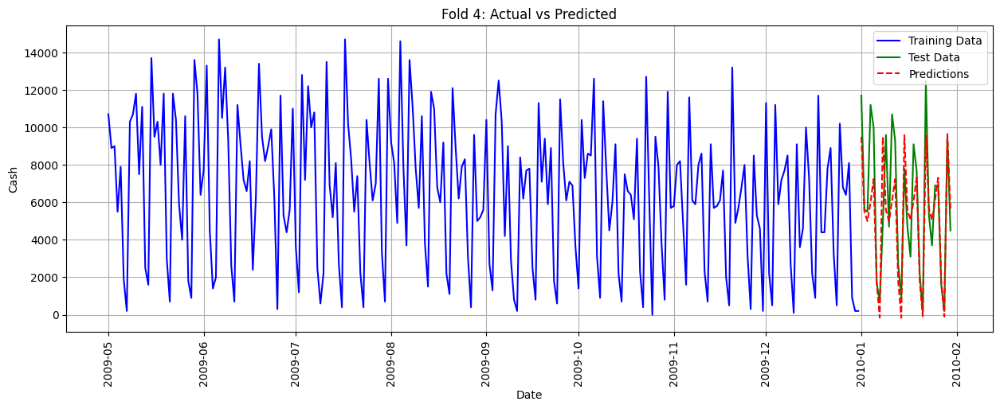

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Che

Fold 5 MAE: 6336705.35, MAPE: nan%


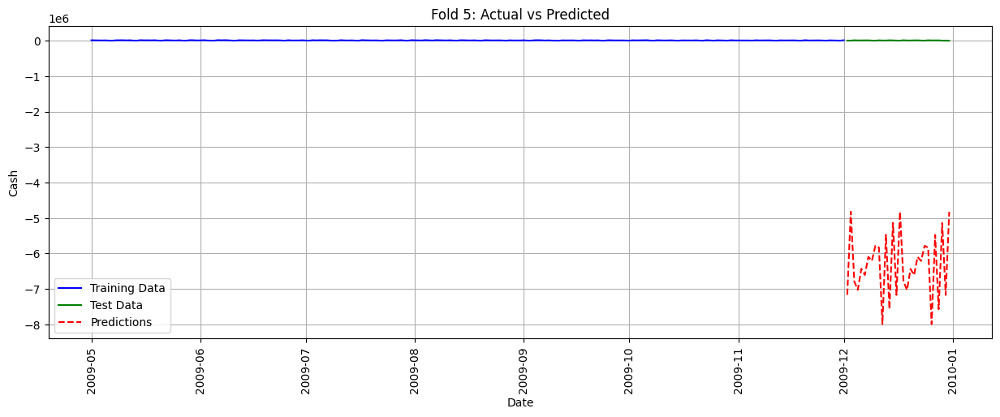

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Che

Fold 6 MAE: 1418.21, MAPE: nan%


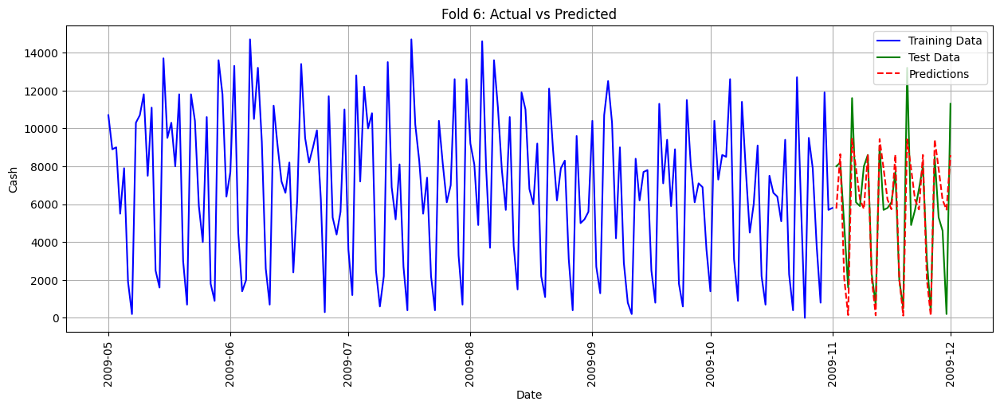

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 7 MAE: 1648.15, MAPE: nan%


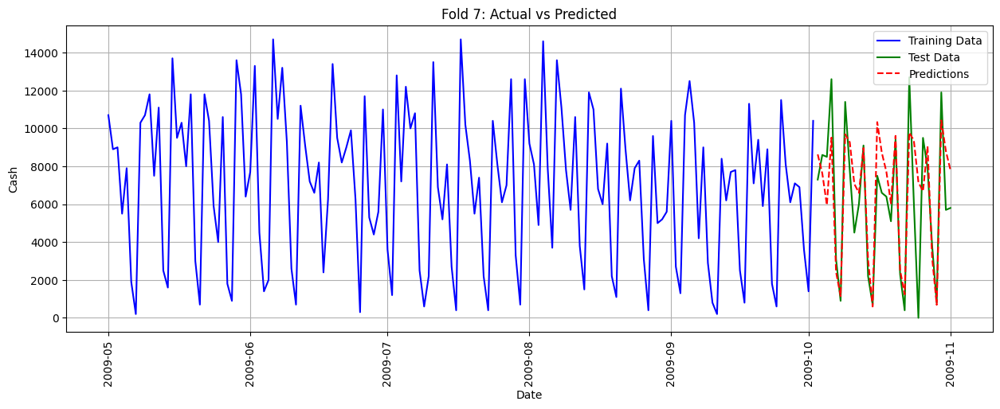

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integ

Fold 8 MAE: 1689.84, MAPE: nan%


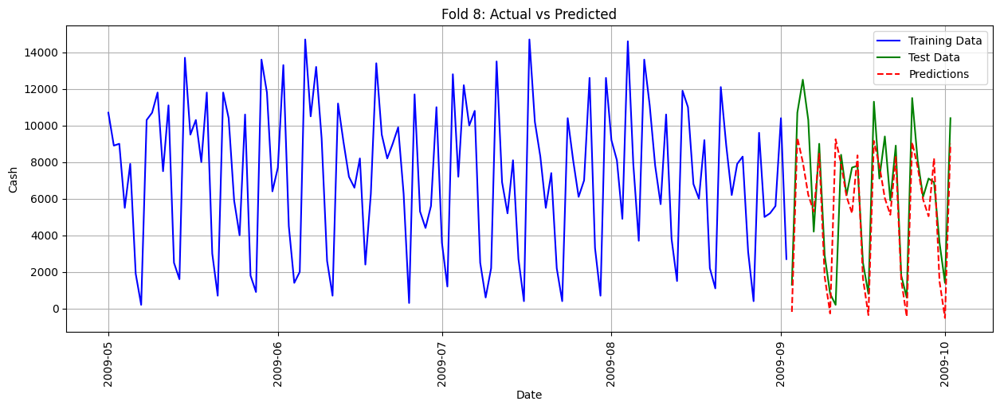

Total Average MAE: 793965.24
Total Average MAPE: nan%


In [ ]:
def arima_forecast(train_data, test_data):
    # Fit ARIMA model
    model = ARIMA(train_data['Cash'], order=(2, 0, 2), seasonal_order=(0, 1, 1, 7))  # You may need to adjust the order
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=len(test_data))

    return forecast

n_train_days = len(df_atm2) - 30
n_test_days = 30

dfs = split_data(df_atm2, n_train_days, n_test_days)
calculate_mae_and_plot(dfs, arima_forecast)


In [ ]:
# from pmdarima import auto_arima

# def auto_arima_forecast(train_data, test_data):
#     # Fit auto ARIMA model
#     model = auto_arima(train_data['Cash'], seasonal=True, m=7)  # Adjust parameters as needed
#     model_fit = model.fit(train_data['Cash'])

#     # Make predictions
#     forecast = model_fit.predict(n_periods=len(test_data))
#     return forecast

# n_train_days = len(df_atm1) - 30
# n_test_days = 30

# dfs = split_data(df_atm2, n_train_days, n_test_days)
# calculate_mae_and_plot(dfs, auto_arima_forecast)


For ATM 2, we have an MAE of 19.08 for the Naive model.
MAE of 21.12 for Arima order=(2, 0, 2), seasonal_order=(0, 1, 1, 7)
and an MAE of 24.36 for Auto Arima. Once again the Naive Seasonal Model had the best resutls when we look at cross validation.

### ATM 3


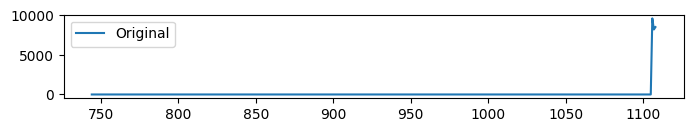

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

frequency = 12  # For example, if data is monthly, set frequency to 12

decomposition = seasonal_decompose(df_atm3['Cash'], model='additive', period=7)
decomposition

plt.figure(figsize=(8, 5))

plt.subplot(411)
plt.plot(df_atm3['Cash'], label='Original')
plt.legend()


ATM 4

For ATM 4, lets take a look at STL to see ow the orignignal, seanal and trend compare for this data. We do see a seasonality with random residuals.

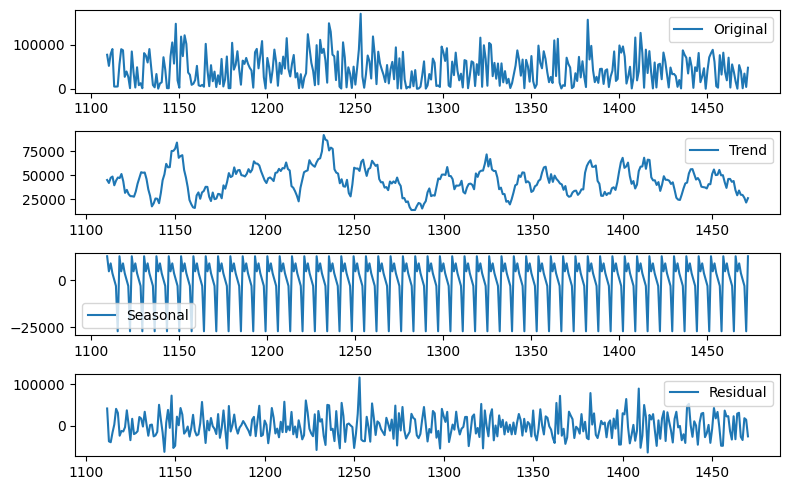

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

frequency = 12  # For example, if data is monthly, set frequency to 12

decomposition = seasonal_decompose(df_atm4['Cash'], model='additive', period=7)
decomposition

plt.figure(figsize=(8, 5))

plt.subplot(411)
plt.plot(df_atm4['Cash'], label='Original')
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label='Residual')
plt.legend()

plt.tight_layout()
plt.show()

Lets test of data with our Naive seosanal model. Compare to ATM 1 and ATM 2, the MAPE is ~460% which just show that we may be not be seeing a 7 day trend in this data as they other two data set we  saw ~ 180 MAE

<ipython-input-43-d7683170e714>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm4['Lag_7'] = df_atm4['Cash'].shift(7)


Fold 1 MAE: 27520.00, MAPE: 394.37%


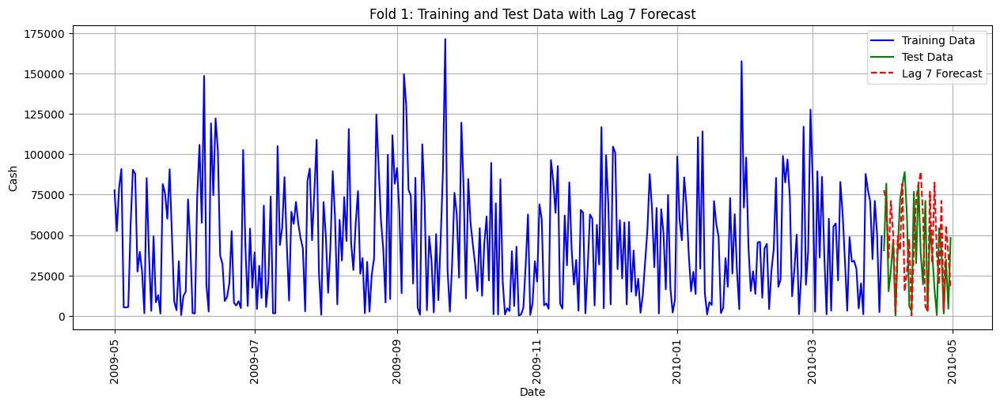



Fold 2 MAE: 34990.00, MAPE: 536.66%


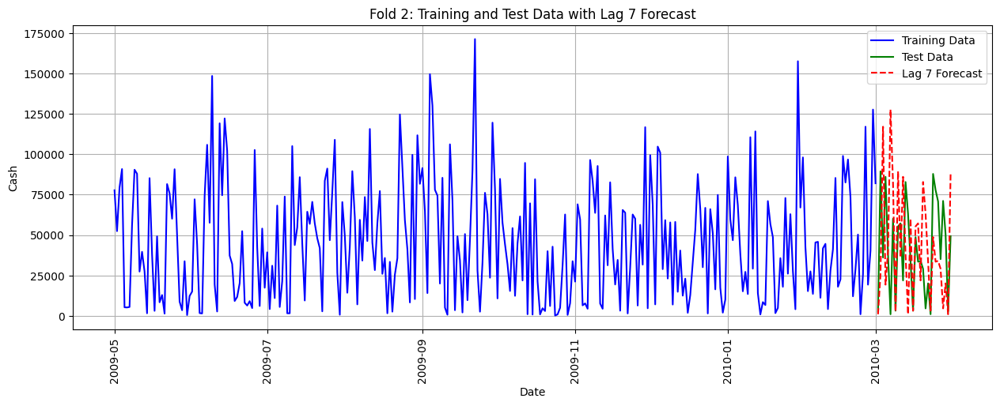



Fold 3 MAE: 39646.67, MAPE: 460.77%


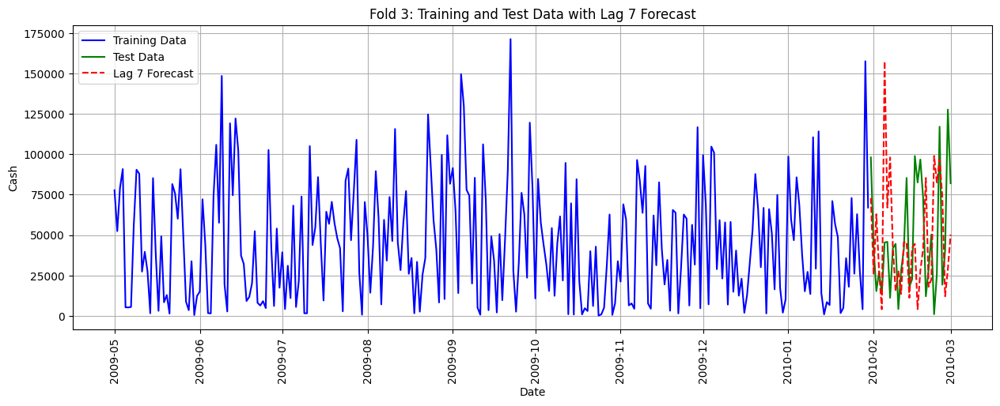



Fold 4 MAE: 31800.00, MAPE: 163.35%


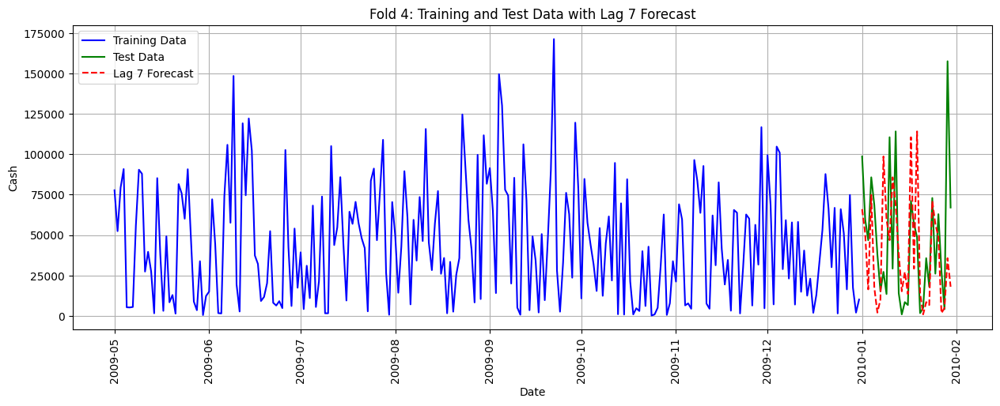



Fold 5 MAE: 35283.33, MAPE: 333.17%


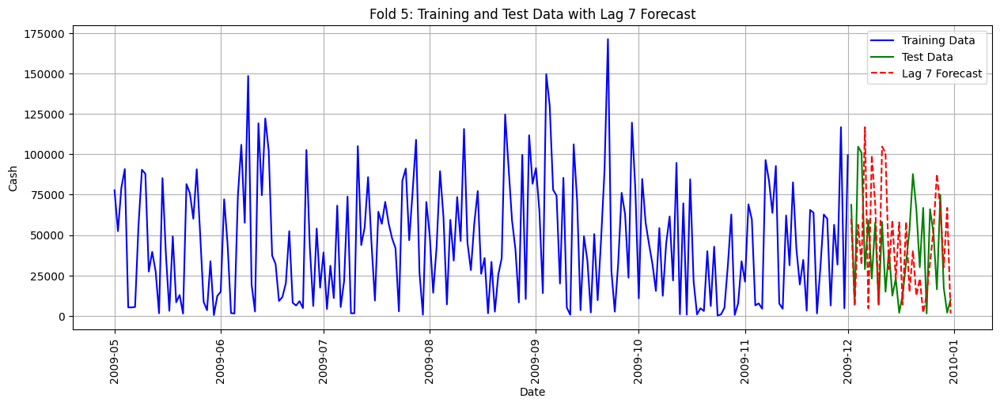



Fold 6 MAE: 33103.33, MAPE: 291.68%


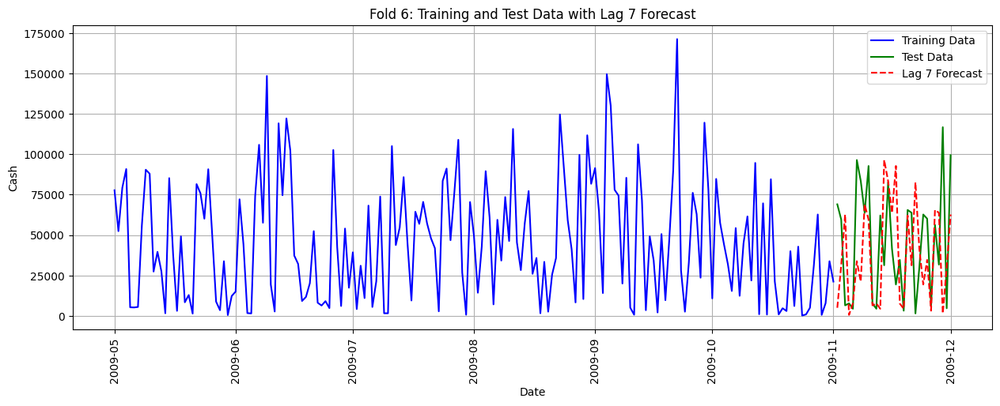



Fold 7 MAE: 26040.00, MAPE: 701.94%


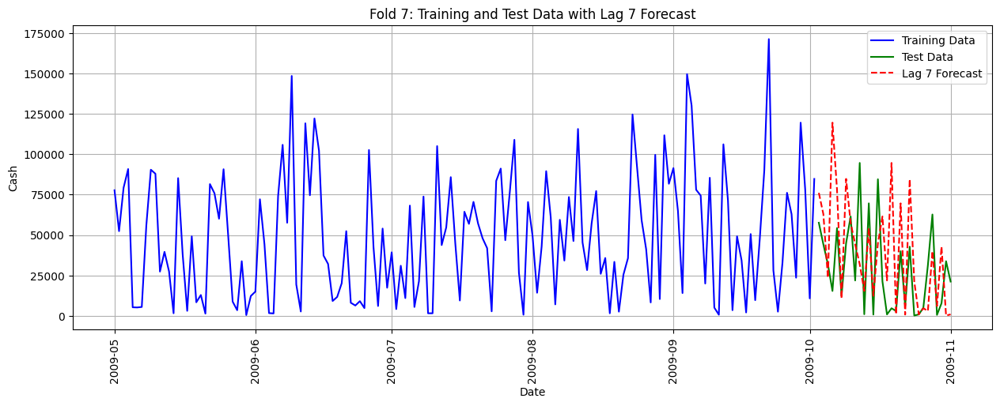



Fold 8 MAE: 45476.67, MAPE: 882.88%


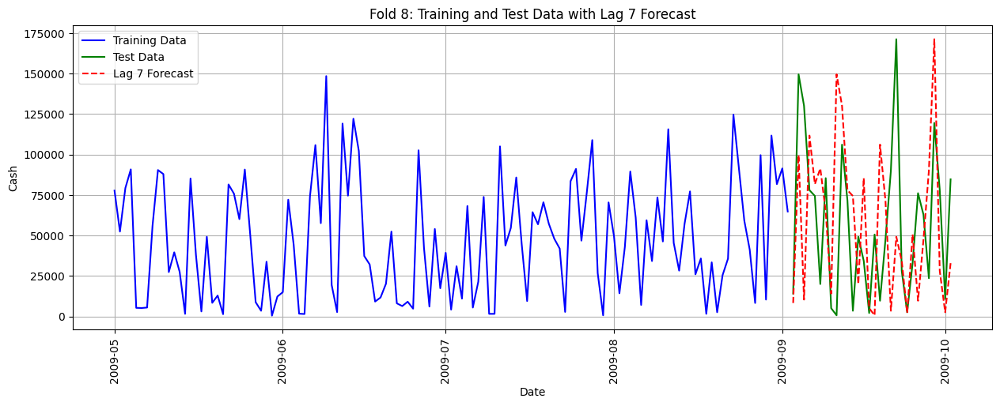



Total Average MAE: 34232.50
Total Average MAPE: 470.60%


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have your data stored in a DataFrame named 'data'
# Replace this with your actual data loading process
df_atm4['Lag_7'] = df_atm4['Cash'].shift(7)
# Number of days for training and testing
n_train_days = len(df_atm4) - 30  # Training data excludes the last 30 days
n_test_days = 30

# List to store the generated DataFrames
dfs = []

# Loop to create eight DataFrames
for i in range(8):
    # Extract training and testing data
    train_data = df_atm4.iloc[:n_train_days]
    test_data = df_atm4.iloc[n_train_days:n_train_days + n_test_days]

    # Append the current fold to the list of DataFrames
    dfs.append((train_data, test_data))

    # Update n_train_days for the next fold
    n_train_days -= n_test_days



total_mae = 0
total_mape = 0

for i, (train_data, test_data) in enumerate(dfs, 1):
    # Calculate MAE
    mae = mean_absolute_error(test_data['Cash'], test_data['Lag_7'])

    # Calculate absolute error
    absolute_error = np.abs(test_data['Cash'] - test_data['Lag_7'])

    # Calculate actual values to avoid division by zero
    actual_values = test_data['Cash'].replace(0, 1)  # Replace zeros with ones to avoid division by zero

    # Calculate percentage error
    percentage_error = (absolute_error / actual_values) * 100

    # Calculate MAPE
    mape = percentage_error.mean()

    # Add current fold MAE and MAPE to total values
    total_mae += mae
    total_mape += mape

    # Output results with two decimal places
    print(f"Fold {i} MAE: {mae:.2f}, MAPE: {mape:.2f}%")

    # Plot training data
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['DATE'], train_data['Cash'], label='Training Data', color='blue')

    # Plot test data
    plt.plot(test_data['DATE'], test_data['Cash'], label='Test Data', color='green')

    # Plot lagged values (forecast) in the test data
    plt.plot(test_data['DATE'], test_data['Lag_7'], label='Lag 7 Forecast', linestyle='--', color='red')

    plt.xlabel('Date')
    plt.ylabel('Cash')
    plt.title(f'Fold {i}: Training and Test Data with Lag 7 Forecast')
    plt.legend()
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()
    print("\n" + "="*40 + "\n")

# Calculate average MAE and MAPE
average_mae = total_mae / len(dfs)
average_mape = total_mape / len(dfs)

# Output total average MAE and MAPE with two decimal places
print(f"Total Average MAE: {average_mae:.2f}")
print(f"Total Average MAPE: {average_mape:.2f}%")

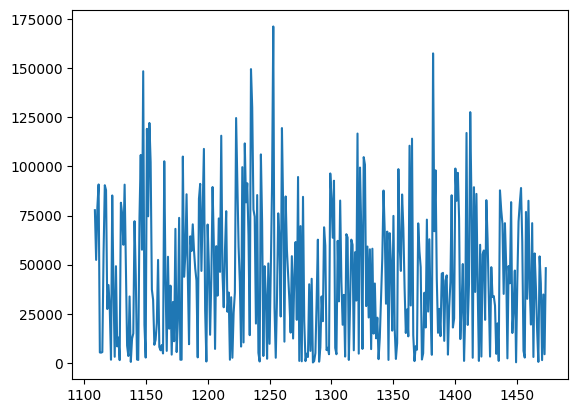

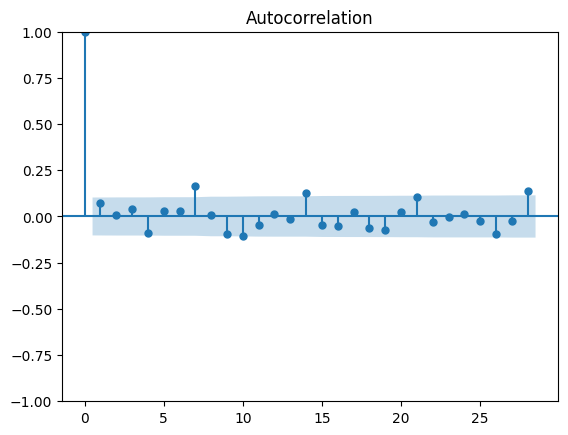

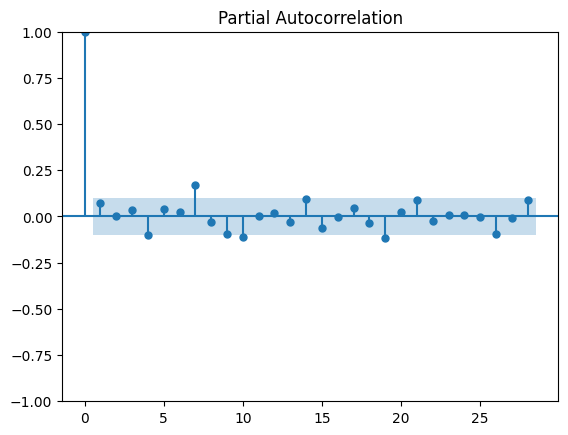

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.plot(df_atm4['Cash'])
# Plot ACF and PACF
plot_acf(df_atm4['Cash'], lags=28)
plt.show()

plot_pacf(df_atm4['Cash'], lags=28)
plt.show()


In [ ]:
# import itertools
# from statsmodels.tsa.statespace.sarimax import SARIMAX

# def SARIMAX_eval_aic(params):
#     p, d, q, P, D, Q, m = params
#     try:
#         model = SARIMAX(df_atm4['Cash'], order=(p, d, q), seasonal_order=(P, D, Q, m))
#         results = model.fit()
#         return results.aic
#     except:
#         return None

# # Define the ranges for p, d, q, P, D, Q, and m
# p_range = range(0, 3)
# d_range = range(0, 1)
# q_range = range(0, 3)
# P_range = range(0, 4)
# D_range = range(0, 1)
# Q_range = range(0, 4)
# m_values = [7]  # Assuming weekly seasonality

# # Generate all possible combinations of p, d, q, P, D, Q, and m
# param_grid = itertools.product(p_range, d_range, q_range, P_range, D_range, Q_range, m_values)

# # Calculate AIC for each combination
# aic_values = {}
# for params in param_grid:
#     aic_values[params] = SARIMAX_eval_aic(params)

# # Print all AIC values
# for params, aic in aic_values.items():
#     print(f"({params}): AIC = {aic}")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 1 MAE: 22384.49, MAPE: nan%


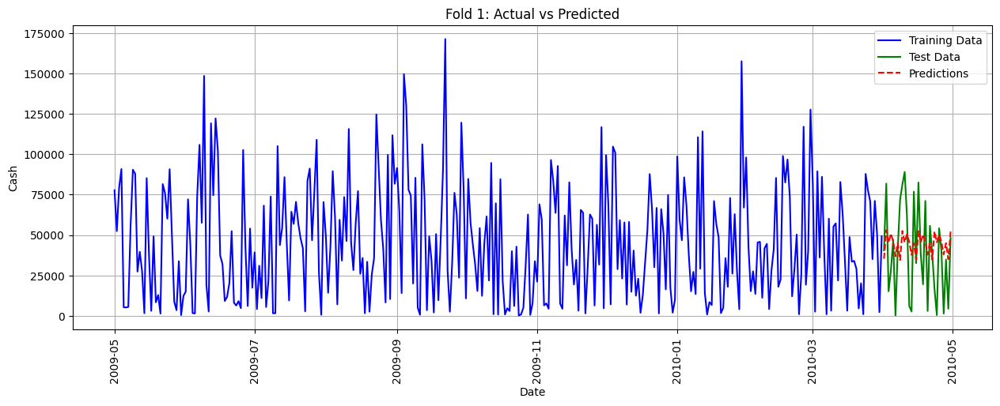

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 2 MAE: 29487.92, MAPE: nan%


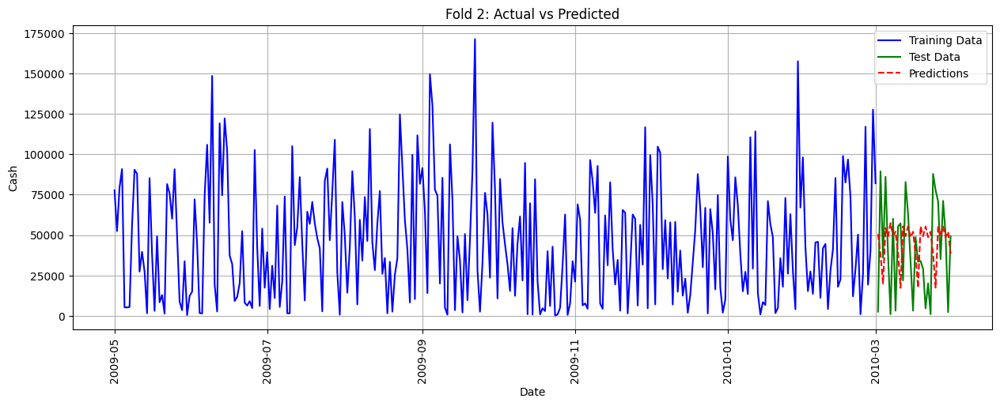

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 3 MAE: 30942.91, MAPE: nan%


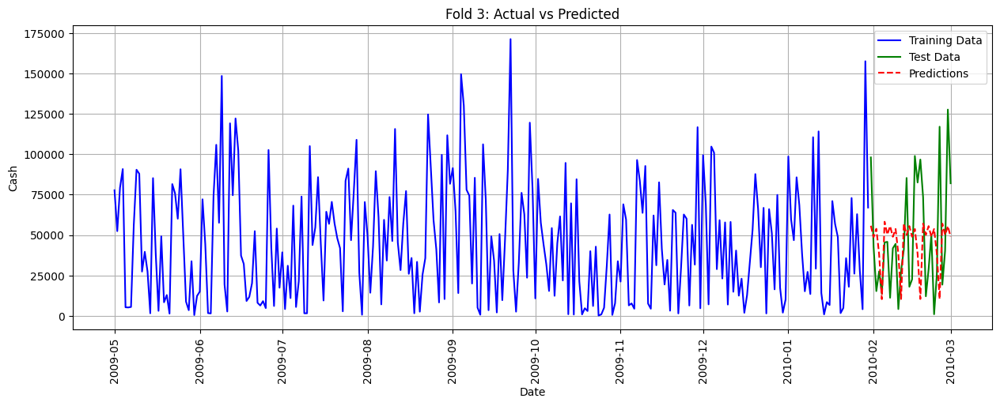

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 4 MAE: 25752.10, MAPE: nan%


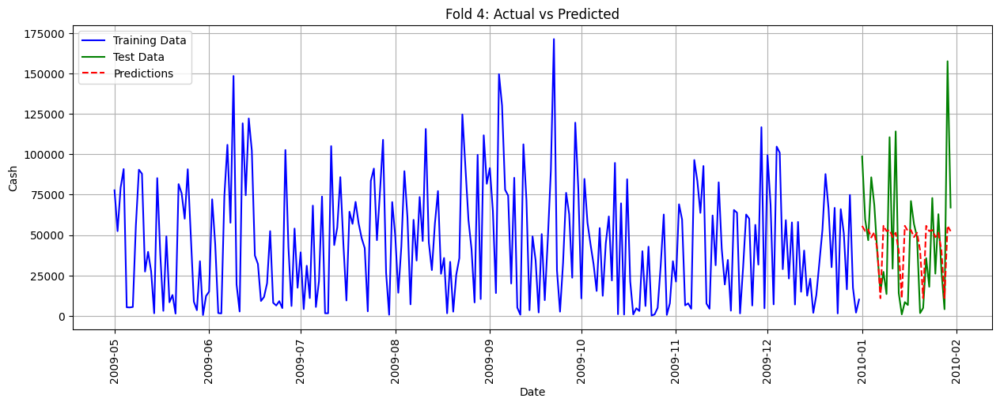

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 5 MAE: 22681.30, MAPE: nan%


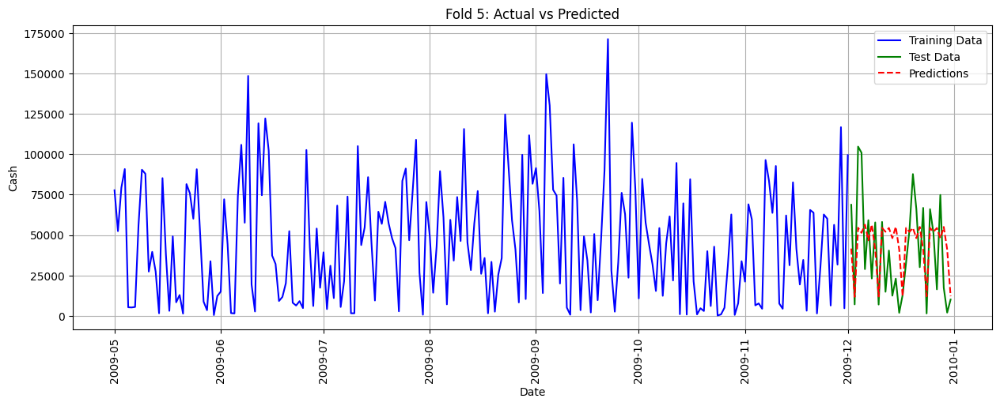

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 6 MAE: 24466.50, MAPE: nan%


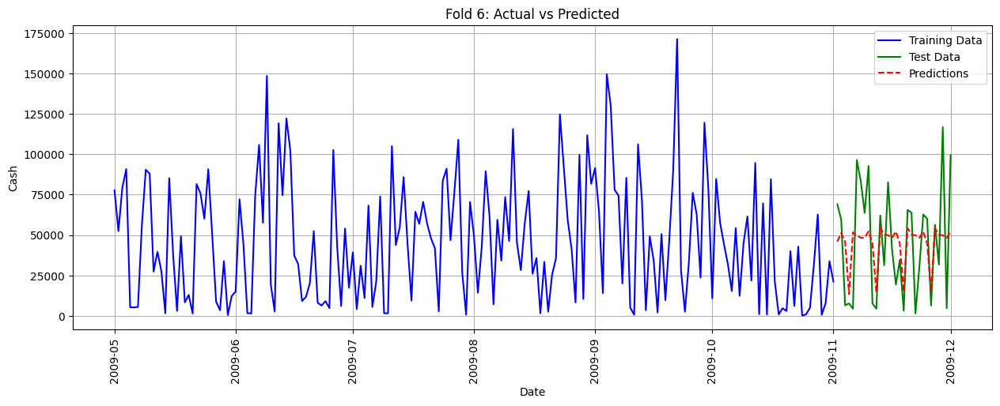

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 7 MAE: 30324.49, MAPE: nan%


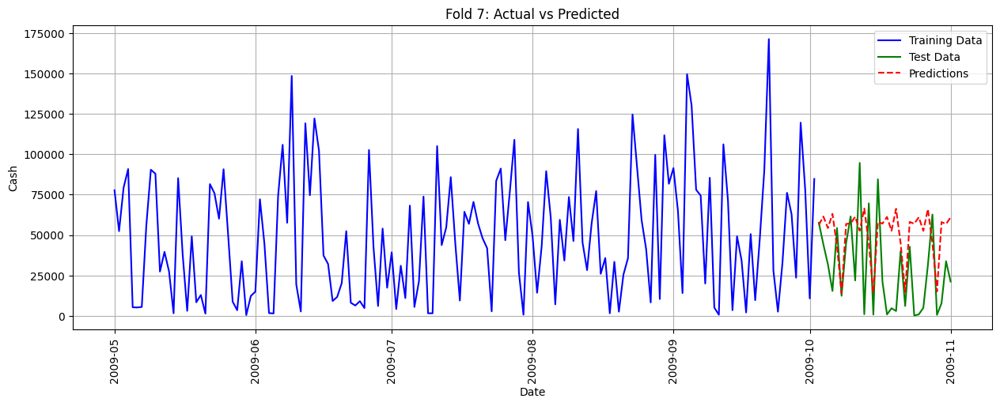

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Fold 8 MAE: 37701.08, MAPE: nan%


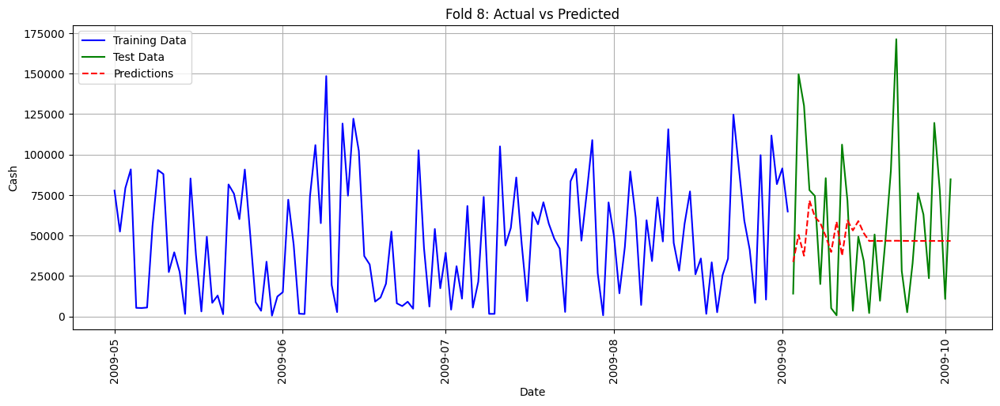

Total Average MAE: 27967.60
Total Average MAPE: nan%


In [ ]:

def arima_forecast(train_data, test_data):
    # Fit ARIMA model
    model = ARIMA(train_data['Cash'], order=(0, 0, 0), seasonal_order=(1, 0, 2, 7))  # You may need to adjust the order
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=len(test_data))

    return forecast

n_train_days = len(df_atm4) - 30
n_test_days = 30

dfs = split_data(df_atm4, n_train_days, n_test_days)
calculate_mae_and_plot(dfs, arima_forecast)


## Selecting Models
Overall, for ATM 1, ATM2 and ATM4, the naive models performed the best in terms of MAE. Hovever, sinc we are forcasting 1 month in the future and our naive seosal model is a lag7, we cant predict 30 days in the future thus I have to select the next best model which are the Arima Models.
Below I am using adfuller library get he ADF tes tto get the p values to check whether we can reject the null hypothesis that the time series has a unit root, indicating that it is non-stationary.
Interpretation: If the p-value of the test is below .05, then the null hypothesis is rejected, and the series is considered stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller


adf_result = adfuller(df_atm1['Cash'])
p_value = adf_result[1]
print("ADF test p-value for df_atm1['Cash']:", p_value)

adf_result = adfuller(df_atm2['Cash'])
p_value = adf_result[1]
print("ADF test p-value for df_atm2['Cash']:", p_value)


adf_result = adfuller(df_atm3['Cash'])
p_value = adf_result[1]
print("ADF test p-value for df_atm3['Cash']:", p_value)


adf_result = adfuller(df_atm4['Cash'])
p_value = adf_result[1]
print("ADF test p-value for df_atm4['Cash']:", p_value)



ADF test p-value for df_atm1['Cash']: 0.025785140067578063
ADF test p-value for df_atm2['Cash']: 0.09547906731236144
ADF test p-value for df_atm3['Cash']: 0.9679074891408068
ADF test p-value for df_atm4['Cash']: 2.71378859058279e-08


In [ ]:
df_atm1

,ATM,Cash,Lag_7
DATE,,,
2009-05-01,ATM1,9600.0,NaN
2009-05-02,ATM1,8200.0,NaN
2009-05-03,ATM1,8500.0,NaN
2009-05-04,ATM1,9000.0,NaN
2009-05-05,ATM1,9900.0,NaN
...,...,...,...
2010-04-26,ATM1,7400.0,8800.0
2010-04-27,ATM1,400.0,300.0
2010-04-28,ATM1,9600.0,10000.0


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


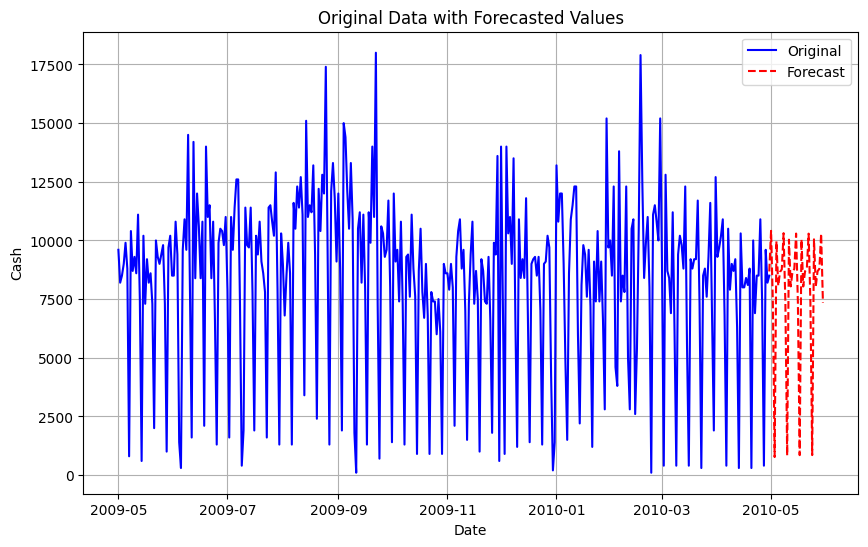

In [ ]:
# df_atm1['DATE'] = pd.to_datetime(df_atm1['DATE'])

# # Set 'Date' column as the index
#df_atm1.set_index('DATE', inplace=True)

model_arima = ARIMA(df_atm1['Cash'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 7))
model_fit = model_arima.fit()
forecast_values = model_fit.forecast(steps=31)
forecast_index = pd.date_range(start=df_atm1.index[-1], periods=31, freq='D')
# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_atm1.index, df_atm1['Cash'], label='Original', color='blue')

# Plot the forecasted values
plt.plot(forecast_index, forecast_values, label='Forecast', color='red', linestyle='--')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Cash')
plt.title('Original Data with Forecasted Values')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

forecast_df = pd.DataFrame({'DATE': forecast_values.index, 'Forecast': forecast_values.values})
forecast_df.to_csv('forecast_atm_1.csv', index=False)


<ipython-input-56-6f81c79f742e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm2['DATE'] = pd.to_datetime(df_atm2['DATE'])
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/pyth

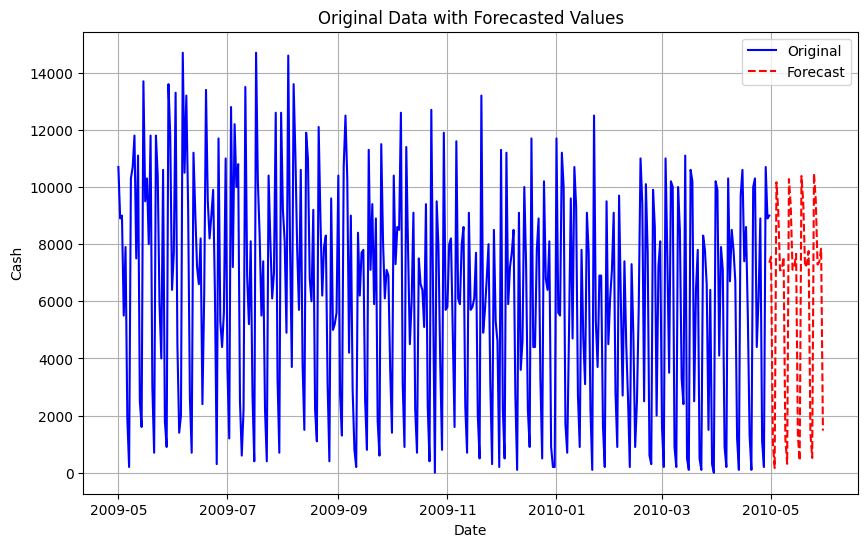

In [ ]:
df_atm2['DATE'] = pd.to_datetime(df_atm2['DATE'])

# Set 'Date' column as the index
df_atm2.set_index('DATE', inplace=True)

model_arima = ARIMA((df_atm2['Cash']), order=(2, 1, 2), seasonal_order=(1, 1, 1, 7))
model_fit = model_arima.fit()
forecast_values = model_fit.forecast(steps=31)

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_atm1.index, df_atm2['Cash'], label='Original', color='blue')

# Plot the forecasted values
plt.plot(forecast_index, forecast_values, label='Forecast', color='red', linestyle='--')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Cash')
plt.title('Original Data with Forecasted Values')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

forecast_df = pd.DataFrame({'DATE': forecast_values.index, 'Forecast': forecast_values.values})
forecast_df.to_csv('forecast_atm_2.csv', index=False)


### ATM 3
For ATM 3, therr are only 3 observations so the best model should be a mean of the last 3 days. In reality you should never have a forcast where your sample size is less than 30 samples.

<ipython-input-57-85efd79c815b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm3['DATE'] = pd.to_datetime(df_atm3['DATE'])


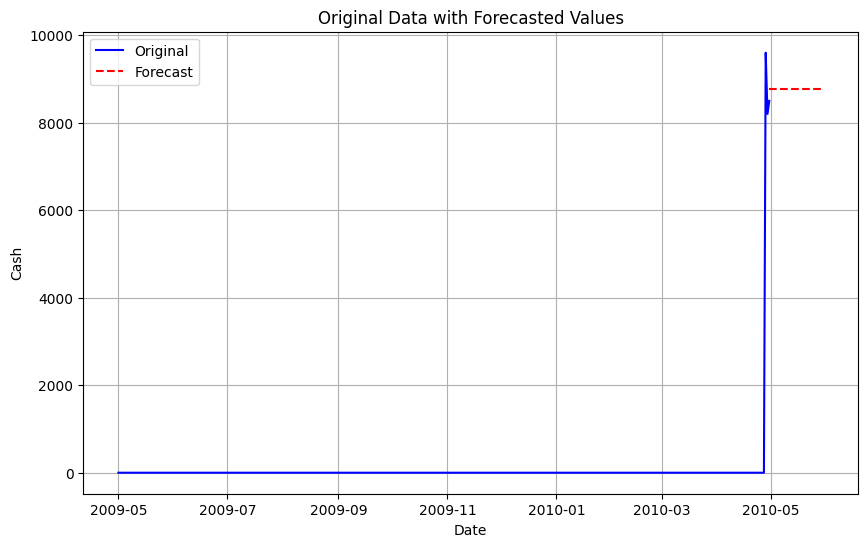

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df_atm3['DATE'] = pd.to_datetime(df_atm3['DATE'])

# Set 'Date' column as the index
df_atm3.set_index('DATE', inplace=True)

model_arima = df_atm3['Cash'].mean()

# Calculate the mean of the last 3 days as the forecast model fit
model_fit = df_atm3['Cash'].iloc[-3:].mean()

# Generate index for the forecast values
forecast_index = pd.date_range(start=df_atm3.index[-1], periods=31, freq='D')

# Create forecast values based on the mean of the last 3 days
forecast_values = pd.Series([model_fit] * len(forecast_index), index=forecast_index)

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_atm3.index, df_atm3['Cash'], label='Original', color='blue')

# Plot the forecasted values
plt.plot(forecast_values.index, forecast_values.values, label='Forecast', color='red', linestyle='--')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Cash')
plt.title('Original Data with Forecasted Values')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

# Save the forecasted values to a CSV file
forecast_df = pd.DataFrame({'DATE': forecast_values.index, 'Forecast': forecast_values.values})
forecast_df.to_csv('forecast_atm_3.csv', index=False)


In [ ]:
df_atm4

,DATE,ATM,Cash,Lag_7
1109,2009-05-01,ATM4,77700.0,NaN
1110,2009-05-02,ATM4,52400.0,NaN
1111,2009-05-03,ATM4,79300.0,NaN
1112,2009-05-04,ATM4,90800.0,NaN
1113,2009-05-05,ATM4,5300.0,NaN
...,...,...,...,...
1469,2010-04-26,ATM4,40400.0,71100.0
1470,2010-04-27,ATM4,1400.0,3000.0
1471,2010-04-28,ATM4,34800.0,55700.0
1472,2010-04-29,ATM4,4400.0,38600.0


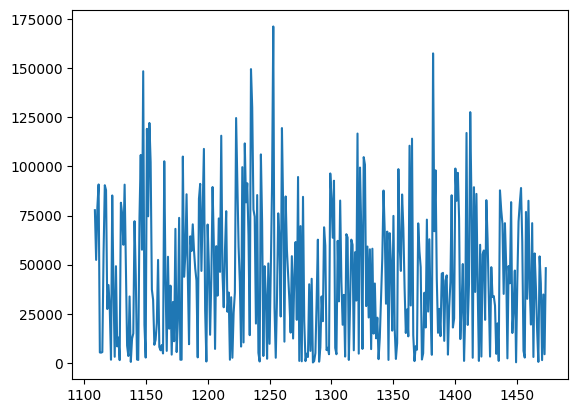

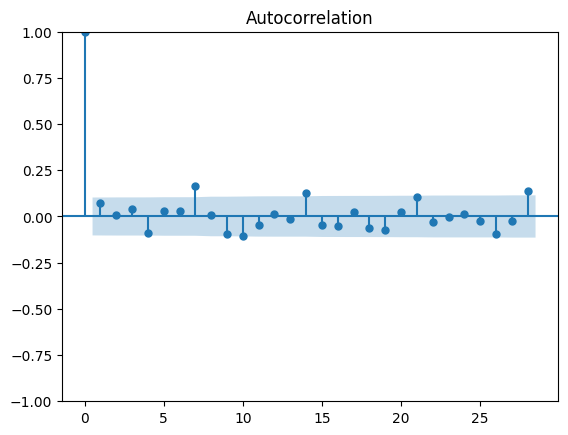

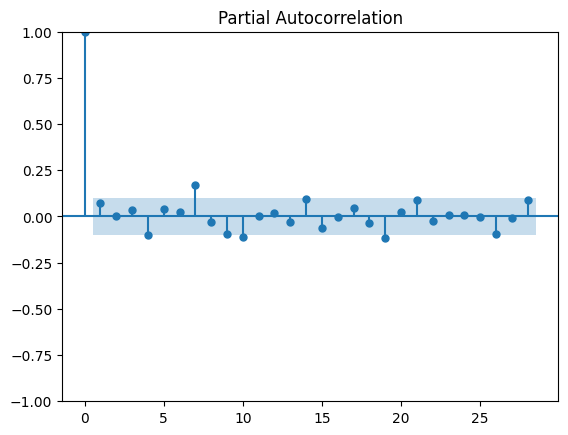

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.plot(df_atm4['Cash'])
# Plot ACF and PACF
plot_acf(df_atm4['Cash'], lags=28)
plt.show()

plot_pacf(df_atm4['Cash'], lags=28)
plt.show()


<ipython-input-71-3ee5751993db>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_atm4['Log_Cash'] = np.log(df_atm4['Cash'])
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3

(-11.169010133091385, 2.669422774291295e-20, 5, 359, {'1%': -3.4486972813047574, '5%': -2.8696246923288418, '10%': -2.571077032068342}, 1201.8439563839381)


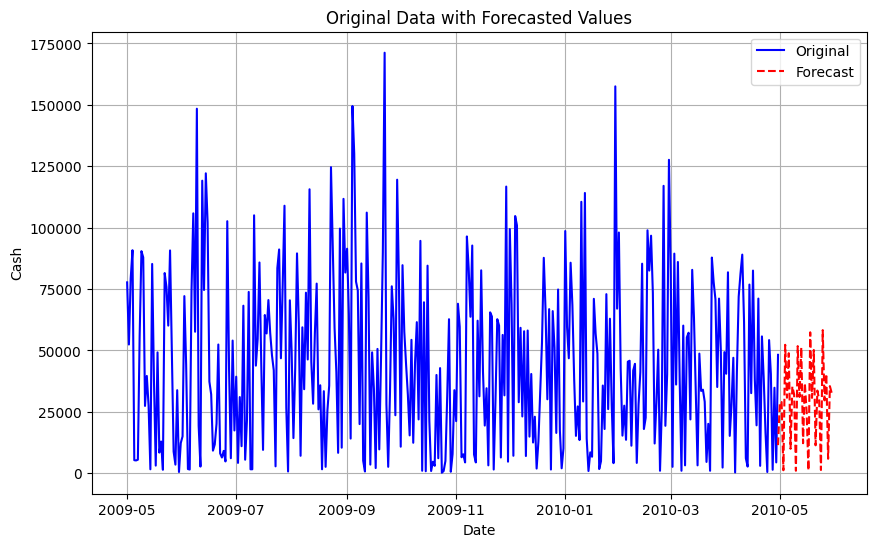

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# df_atm4['DATE'] = pd.to_datetime(df_atm4['DATE'])

# # # Set 'Date' column as the index
# df_atm4.set_index('DATE', inplace=True)

df_atm4['Log_Cash'] = np.log(df_atm4['Cash'])

# Fit ARIMA model to the log-transformed data
model_arima = ARIMA(df_atm4['Log_Cash'], order=(1, 0, 1), seasonal_order=(6, 2, 1, 7))
model_fit = model_arima.fit()

residuals = model_fit.resid
adf_result = adfuller(residuals)
print(adf_result)
# Forecast future 31 days
forecast_values = model_fit.forecast(steps=31)

# Plot the original data
plt.figure(figsize=(10, 6))
plt.plot(df_atm4.index, df_atm4['Cash'], label='Original', color='blue')

# Plot the forecasted values
forecast_index = pd.date_range(start=df_atm4.index[-1], periods=31, freq='D')
plt.plot(forecast_index, np.exp(forecast_values), label='Forecast', color='red', linestyle='--')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Cash')
plt.title('Original Data with Forecasted Values')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

# Save the forecasted values to a CSV file
forecast_df = pd.DataFrame({'DATE': forecast_index, 'Forecast': np.exp(forecast_values)})
forecast_df.to_csv('forecast_atm_4.csv', index=False)


## Part B
Consists of a simple dataset of residential power usage for January 1998 until December 2013.  Your assignment is to model these data and a monthly forecast for 2014.  The data is given in a single file.  The variable ‘df_pwr’ is power consumption in Kilowatt hours, the rest is straight forward.    Add this to your existing files above.

In [ ]:
from scipy.stats import boxcox
from scipy.stats import boxcox_llf
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.tools import diff
from statsmodels.tsa.stattools import acf, pacf
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [ ]:
df_pwr

,CaseSequence,YYYY-MMM,KWH
0,733,1998-Jan,6862583.0
1,734,1998-Feb,5838198.0
2,735,1998-Mar,5420658.0
3,736,1998-Apr,5010364.0
4,737,1998-May,4665377.0
...,...,...,...
187,920,2013-Aug,9080226.0
188,921,2013-Sep,7968220.0
189,922,2013-Oct,5759367.0
190,923,2013-Nov,5769083.0


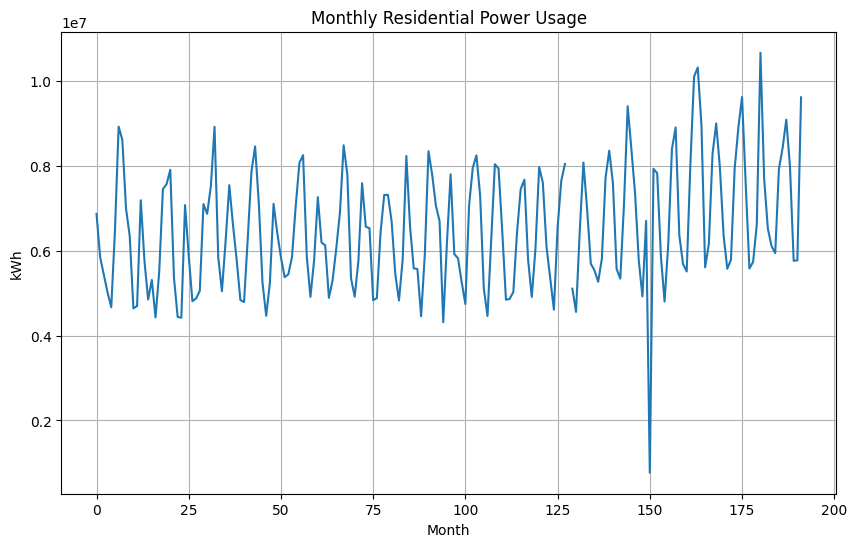

In [ ]:
# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(df_pwr['KWH'])
plt.title("Monthly Residential Power Usage")
plt.xlabel("Month")
plt.ylabel("kWh")
plt.grid(True)
plt.show()


There is a clear seasonality in this data. There is a very noticeable dip in value in July 2010 which may be any outlier. the Variance also increases towerd the end tail of the data so a tranformation may make sense.

In [ ]:
df_pwr.loc[df_pwr.index[150], 'KWH'] = np.nan

I replaced jul 2010 data with null and then replaced nulls with -12 lag.

In [ ]:
df_pwr_shifted = df_pwr.shift(12)

# Impute missing values in July using the shifted data
df_pwr['KWH'] = df_pwr['KWH'].fillna(df_pwr_shifted['KWH'])

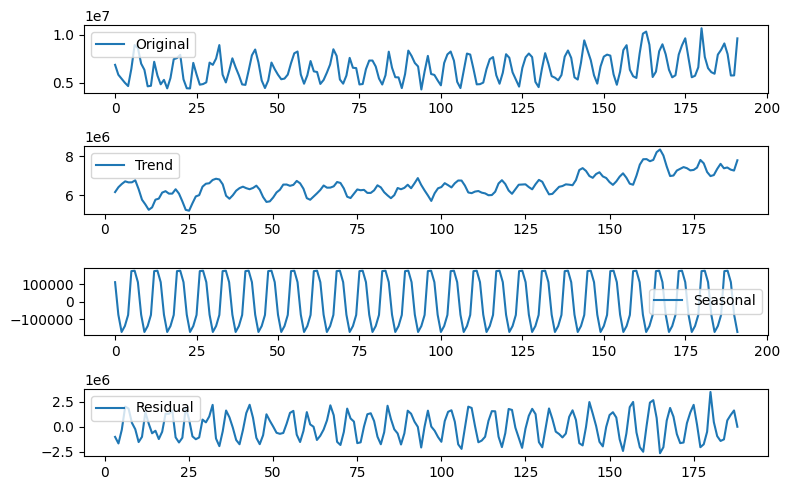

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

frequency = 12  # For example, if data is monthly, set frequency to 12

decomposition = seasonal_decompose(df_pwr['KWH'], model='additive', period=7)
decomposition

plt.figure(figsize=(8, 5))

plt.subplot(411)
plt.plot(df_pwr['KWH'], label='Original')
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label='Residual')
plt.legend()

plt.tight_layout()
plt.show()

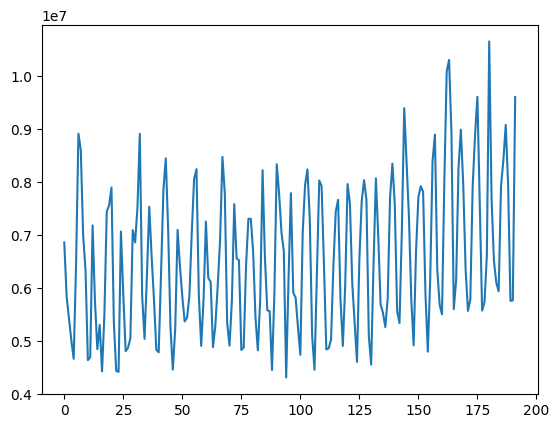

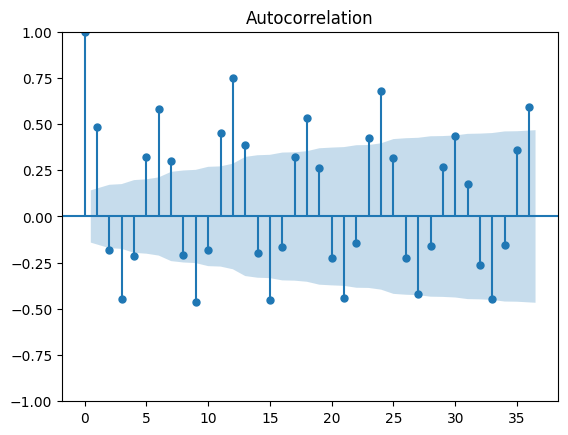

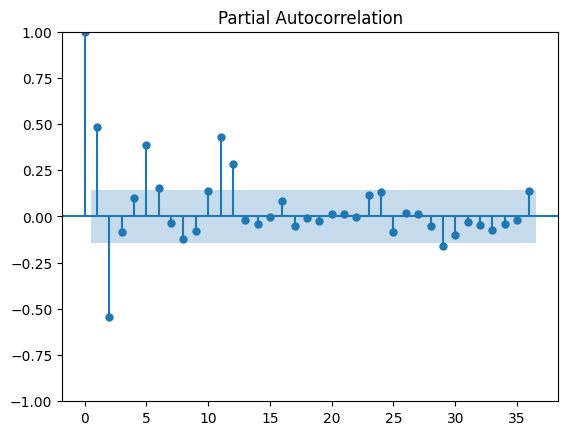

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.plot(df_pwr['KWH'])
# Plot ACF and PACF
plot_acf(df_pwr['KWH'], lags=36)
plt.show()

plot_pacf(df_pwr['KWH'], lags=36)
plt.show()


In [ ]:
from scipy.stats import boxcox

# Apply Box-Cox transformation
kwh_trans, kwh_lambda = boxcox(df_pwr['KWH'])
kwh_lambda

-0.2820279590925985

The interpretation of lambda values in the Box-Cox transformation is as follows:
- Lambda = 0: Logarithmic transformation.
- Lambda close to 1: No transformation (or very mild transformation).
- Lambda < 0: Reciprocal transformation (including square root, reciprocal square root, etc. depending on the magnitude of lambda).
- Lambda > 1: Power transformation.
Therefore, a lambda value of -0.28 suggests a transformation that is close to a reciprocal square root transformation.

We will apply log tranformation to our data.

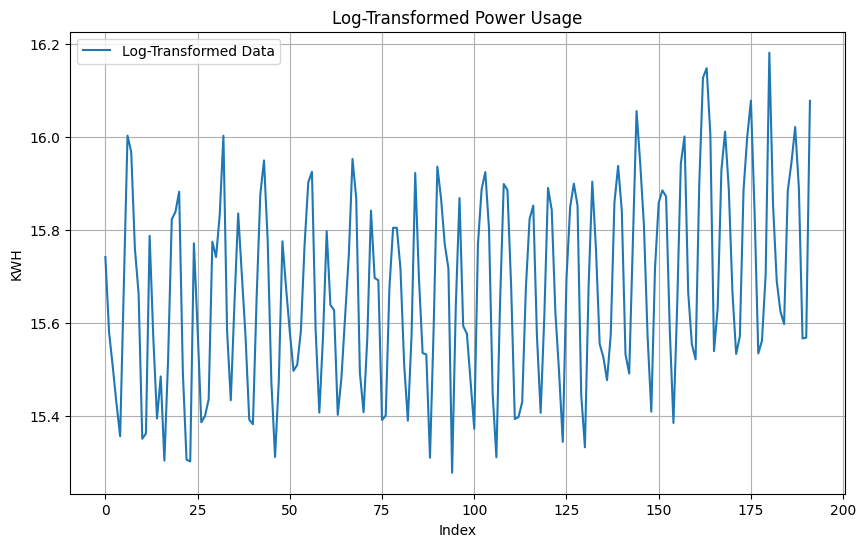

In [ ]:
df_pwr['KWH_log'] = np.log(df_pwr['KWH'])
plt.figure(figsize=(10, 6))
plt.plot(df_pwr.index, df_pwr['KWH_log'], label='Log-Transformed Data')
plt.xlabel('Index')  # Adjust as needed
plt.ylabel('KWH')
plt.title('Log-Transformed Power Usage')
plt.legend()
plt.grid(True)
plt.show()



The time series appears to exhibit stationarity, indicating that no non-seasonal differencing is necessary. The partial autocorrelation function (PACF) reveals decaying seasonal spikes, suggesting a seasonal autoregressive (AR) component, likely of order 1 (AR(1)). Additionally, the autocorrelation function (ACF) exhibits rapidly decaying seasonal spikes, hinting at the potential presence of a seasonal moving average (MA) component, possibly of order 1 (MA(1)).

Notably, there are significant spikes in both the PACF and ACF at lag 1 and lag 4. These spikes suggest the consideration of non-seasonal autoregressive (AR) components, potentially AR(1) or AR(4), as well as non-seasonal moving average (MA) components, possibly MA(1) or MA(4).

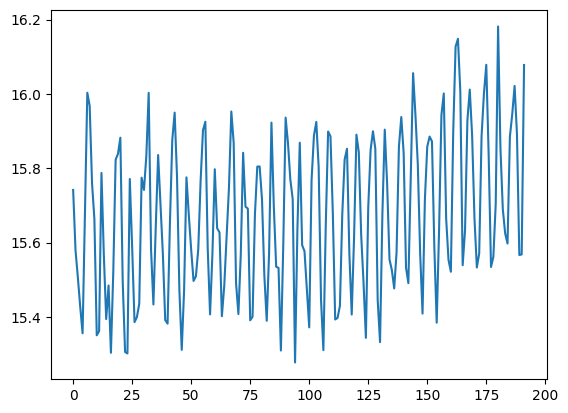

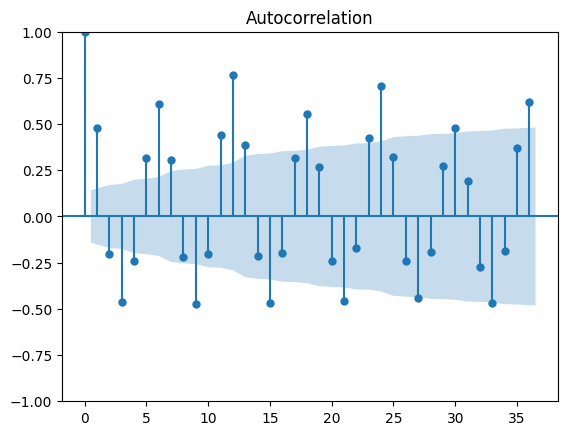

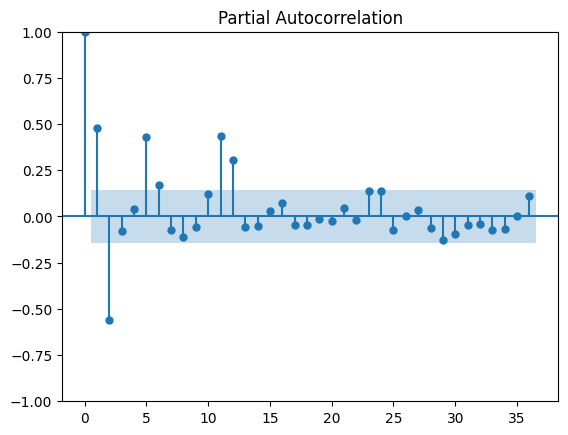

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.plot(df_pwr['KWH_log'])
# Plot ACF and PACF
plot_acf(df_pwr['KWH_log'], lags=36)
plt.show()

plot_pacf(df_pwr['KWH_log'], lags=36)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error


def split_data(df, n_train_days, n_test_days):
    dfs = []
    for i in range(5):
        train_data = df.iloc[:n_train_days]
        test_data = df.iloc[n_train_days:n_train_days + n_test_days]
        dfs.append((train_data, test_data))
        n_train_days -= n_test_days
    return dfs

def calculate_mae(predictions, actual):
    return mean_absolute_error(actual, predictions)

def plot_actual_vs_predicted_pwr(train_data, test_data, predictions, fold_num):
    plt.figure(figsize=(15, 5))
    plt.plot(train_data['YYYY-MMM'], train_data['KWH_log'], label='Training Data', color='blue')
    plt.plot(test_data['YYYY-MMM'], test_data['KWH_log'], label='Test Data', color='green')
    plt.plot(test_data['YYYY-MMM'], predictions, label='Predictions', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('KWH_log')
    plt.title(f'Fold {fold_num}: Actual vs Predicted')
    plt.xticks(rotation=90)
    plt.legend()
    plt.grid(True)
    plt.show()

def calculate_mae_and_plot(dfs, forecast_function):
    total_mae = 0

    for i, (train_data, test_data) in enumerate(dfs, 1):
        predictions = forecast_function(train_data, test_data)
        mae = calculate_mae(predictions, test_data['KWH_log'])
        total_mae += mae
        print(f"Fold {i} MAE: {mae:.2f}")
        plot_actual_vs_predicted_pwr(train_data, test_data, predictions, i)
        print("\n" + "="*40 + "\n")

    average_mae = total_mae / len(dfs)
    print(f"Total Average MAE: {average_mae:.2f}")


In [84]:
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX

def SARIMAX_eval_aic(params):
    p, d, q, P, D, Q, m = params
    try:
        model = SARIMAX(df_pwr['KWH_log'], order=(p, d, q), seasonal_order=(P, D, Q, m))
        results = model.fit()
        return results.aic
    except:
        return None

# Define the ranges for p, d, q, P, D, Q, and m
p_range = range(0, 3)
d_range = range(0, 1)
q_range = range(0, 3)
P_range = range(0, 3)
D_range = range(0, 1)
Q_range = range(0, 3)
m_values = [7]  # Assuming weekly seasonality

# Generate all possible combinations of p, d, q, P, D, Q, and m
param_grid = itertools.product(p_range, d_range, q_range, P_range, D_range, Q_range, m_values)

# Calculate AIC for each combination
aic_values = {}
for params in param_grid:
    aic_values[params] = SARIMAX_eval_aic(params)

# Print all AIC values
for params, aic in aic_values.items():
    print(f"({params}): AIC = {aic}")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodel

((0, 0, 0, 0, 0, 0, 7)): AIC = 1603.6321094569312
((0, 0, 0, 0, 0, 1, 7)): AIC = 1370.169825489805
((0, 0, 0, 0, 0, 2, 7)): AIC = 1156.5380779563818
((0, 0, 0, 1, 0, 0, 7)): AIC = 62.58646871217856
((0, 0, 0, 1, 0, 1, 7)): AIC = 35.03941952002192
((0, 0, 0, 1, 0, 2, 7)): AIC = 8.0
((0, 0, 0, 2, 0, 0, 7)): AIC = 62.97189196027972
((0, 0, 0, 2, 0, 1, 7)): AIC = 66.3356550063063
((0, 0, 0, 2, 0, 2, 7)): AIC = 294.16593588217097
((0, 0, 1, 0, 0, 0, 7)): AIC = 1346.1567837244188
((0, 0, 1, 0, 0, 1, 7)): AIC = 1125.890694452201
((0, 0, 1, 0, 0, 2, 7)): AIC = 935.4829758055164
((0, 0, 1, 1, 0, 0, 7)): AIC = -11.650559505281514
((0, 0, 1, 1, 0, 1, 7)): AIC = -65.1834672457502
((0, 0, 1, 1, 0, 2, 7)): AIC = 131.86516069706727
((0, 0, 1, 2, 0, 0, 7)): AIC = -21.298569745988758
((0, 0, 1, 2, 0, 1, 7)): AIC = -8.702968112018013
((0, 0, 1, 2, 0, 2, 7)): AIC = 296.50356709995344
((0, 0, 2, 0, 0, 0, 7)): AIC = 1098.757610396308
((0, 0, 2, 0, 0, 1, 7)): AIC = 877.0938912293907
((0, 0, 2, 0, 0, 2, 7)):

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [86]:
def arima_forecast(train_data, test_data):
    # Fit ARIMA model
    model = ARIMA(train_data['KWH_log'], order=(1, 0, 0), seasonal_order=(0, 1, 1, 12))
    model_fit = model.fit()

    # Make predictions
    forecast = model_fit.forecast(steps=len(test_data))

    return forecast

n_train_days = len(df_pwr) - 30
n_test_days = 30

dfs = split_data(df_pwr, n_train_days, n_test_days)
calculate_mae_and_plot(dfs, arima_forecast)


,CaseSequence,YYYY-MMM,KWH,KWH_log
0,733,1998-Jan,6862583.0,15.741594
1,734,1998-Feb,5838198.0,15.579933
2,735,1998-Mar,5420658.0,15.505728
3,736,1998-Apr,5010364.0,15.427019
4,737,1998-May,4665377.0,15.355679
...,...,...,...,...
187,920,2013-Aug,9080226.0,16.021610
188,921,2013-Sep,7968220.0,15.890972
189,922,2013-Oct,5759367.0,15.566338
190,923,2013-Nov,5769083.0,15.568024


Here I am testing auto arima to give me the best model based on AIC and it considers order=(1, 1, 1), seasonal_order=(1, 0, 1, 12) the best model.

 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-47.142, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-129.801, Time=0.41 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-211.037, Time=0.59 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-268.075, Time=4.24 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-64.214, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-128.238, Time=1.28 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=2.70 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=4.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.62 sec
 ARIMA(0,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,3)(0,0,1)[12] intercept   : AIC=-213.820, Time=1.28 sec
 ARIMA(0,1,3)(1,0,0)[12] intercept   : AIC=-284.862, Time=1.06 sec
 ARIMA(0,1,3)(1,0,1)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


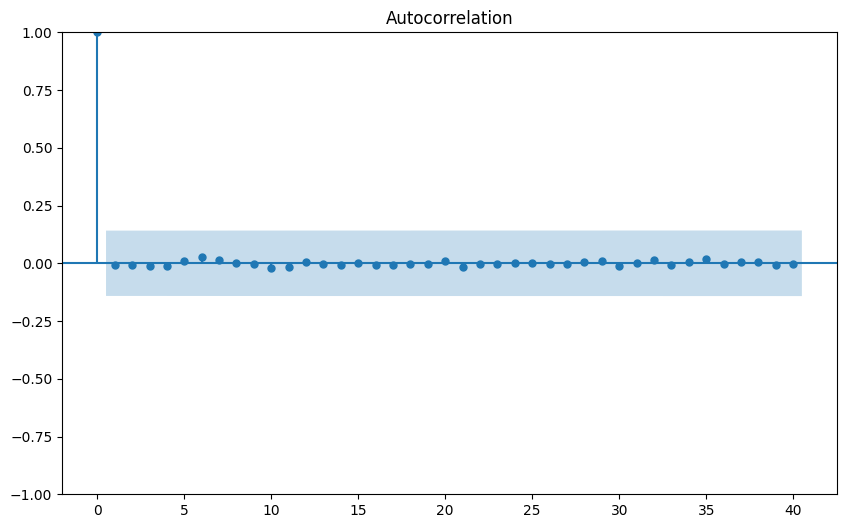

In [93]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Assuming df_pwr is your DataFrame containing the log-transformed data
# Apply log transformation to the data
df_pwr['KWH_log'] = np.log(df_pwr['KWH'])

# Define AIC function
def kwh_aic(p, q, P, Q):
    model = ARIMA(df_pwr['KWH_log'], order=(p, 0, q), seasonal_order=(P, 1, Q, 12))
    results = model.fit()
    return results.aic

# Find the best ARIMA model
best_model = auto_arima(df_pwr['KWH_log'], seasonal=True, m=12, max_order=None, max_d=1,
                        max_p=3, max_q=3, max_P=1, max_Q=1,
                        stepwise=False, information_criterion='aic',
                        trace=True, error_action='ignore', suppress_warnings=True)

print("Best ARIMA model:", best_model.order, best_model.seasonal_order)

# Fit the ARIMA model
kwh_fit = ARIMA(df_pwr['KWH_log'], order=(1, 1, 1), seasonal_order=(1, 0, 1, 12)).fit()

# Forecast
forecast_steps = 12  # Assuming you want to forecast 12 steps ahead
forecast_values_log = kwh_fit.forecast(steps=forecast_steps)

# Reverse the log transformation
forecast_values = np.exp(forecast_values_log)

# Plot residuals
residuals = kwh_fit.resid
fig, ax = plt.subplots(figsize=(10, 6))
plot_acf(residuals, ax=ax, lags=40)
plt.show()


As anticipated, the forecast exhibits annual seasonality with some drift attributed to the non-seasonal autocorrelation. The forecasted values are exported to a .csv file

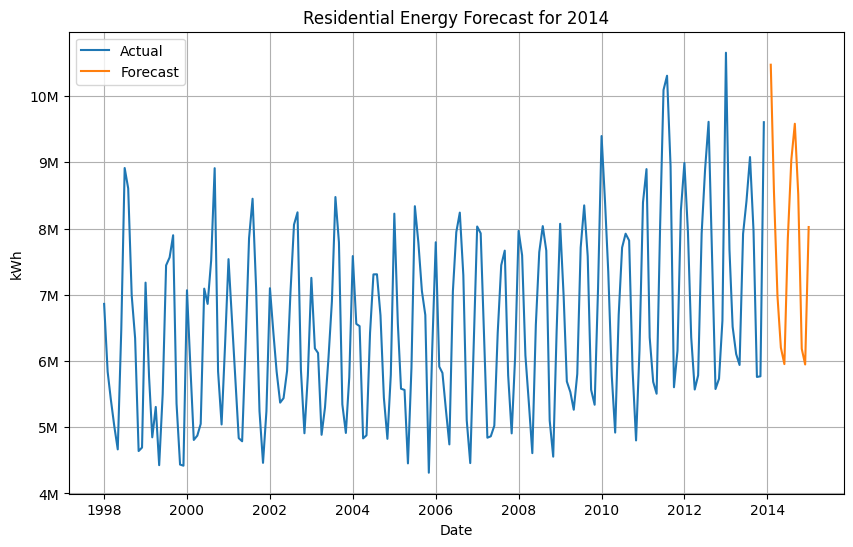

In [100]:
import matplotlib.ticker as ticker

# Define a custom formatter function to display values in millions
def millions_formatter(x, pos):
    return f'{x/1e6:.0f}M'

# Plot the forecast
plt.figure(figsize=(10, 6))
plt.plot(df_pwr.index, df_pwr['KWH'], label='Actual')
plt.plot(pd.date_range(start="2014-01-01", periods=12, freq="M"), forecast_values, label='Forecast')
plt.title("Residential Energy Forecast for 2014")
plt.xlabel("Date")
plt.ylabel("kWh")
plt.legend()
plt.grid(True)

# Apply the custom formatter to the y-axis
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter))

plt.show()

# Save forecast to CSV
forecast_df = pd.DataFrame({'YYYY-MMM': pd.date_range(start="2014-01-01", periods=12, freq="M").strftime('%Y-%b'),
                            'df_pwr': forecast_values})
forecast_df.to_csv("partB_output.csv", index=False)


## Part C
Consists of two data sets.  These are simple 2 columns sets, however they have different time stamps.  Your optional assignment is to time-base sequence the data and aggregate based on hour (example of what this looks like, follows).  Note for multiple recordings within an hour, take the mean.  Then to determine if the data is stationary and can it be forecast.  If so, provide a week forward forecast and present results via Rpubs and .rmd and the forecast in an Excel readable file.   

Below were the steps takenm to combine the two files.
Alignment of Start Dates: Both dataframes (df_pipeline1 and df_pipeline2) were adjusted to commence on the same start date, which is October 23, 2015.

Conversion of Readings: Since the readings from pipeline 1 were taken at irregular intervals and sometimes more than once per hour, they were standardized to hourly intervals. This conversion ensured consistency with the readings from pipeline 2, which were recorded at the end of each hour.

Handling Different End Dates: The two dataframes had different end dates. However, for the purpose of combining them, only the data up to November 1, 2015, from df_pipeline1 was retained to match the end date of df_pipeline2.

Combination: After aligning the start dates, converting readings, and handling the end dates, the data from both pipelines were combined into a single dataframe. This merged dataframe contains readings from both pipelines, allowing for comprehensive analysis and comparison.






In [111]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima.utils import ndiffs
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import boxcox
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Read data
pipeline1 = df_wp1
pipeline2 = df_wp2

# Rename columns
pipeline1.columns = ["DateTime", "WaterFlow"]
pipeline2.columns = ["DateTime", "WaterFlow"]

# Combine readings for pipeline 1 to hourly
pipeline1["DateTime"] = pd.to_datetime(pipeline1["DateTime"])
pipeline2["DateTime"] = pd.to_datetime(pipeline2["DateTime"])
pipeline1_hourly = pipeline1.resample("H", on="DateTime").mean().reset_index()

# Join datasets
water_df = pd.merge(pipeline1_hourly, pipeline2, on="DateTime", how="outer", suffixes=("_1", "_2"))
water_df["WaterFlow_1"] = water_df["WaterFlow_1"].fillna(0)
water_df["WaterFlow"] = water_df["WaterFlow_1"] + water_df["WaterFlow_2"].fillna(method='ffill')
water_ts = pd.Series(water_df["WaterFlow"].values, index=water_df["DateTime"])
water_ts.index.freq = "H"

# Plot timeseries
fig = go.Figure()
fig.add_trace(go.Scatter(x=water_ts.index, y=water_ts.values, mode="lines", name="WaterFlow"))
fig.update_layout(title="Two Pipelines Hourly Water Flow",
                  xaxis_title="Day",
                  yaxis_title="Total Waterflow",
                  showlegend=False)
fig.show()


This plot displays noticeable variability throughout the entire range, exhibiting an initial downward trend until approximately day 10, followed by a relatively stable period until the end of the observation window.
We will be applying Box-Cox transformation in order to see whether a tranformation will improve the distribution


In [118]:
# Drop rows with missing values
water_df.dropna(inplace=True)
water_df.describe()

,WaterFlow_1,WaterFlow_2,WaterFlow
count,1000.000000,1000.000000,1000.000000
mean,4.668563,39.555507,44.224070
std,8.672528,16.049275,18.145164
min,0.000000,1.884619,1.884619
25%,0.000000,28.140185,31.110549
50%,0.000000,39.681764,43.836161
75%,0.000000,50.781837,56.657048
max,31.729930,78.303208,100.644700


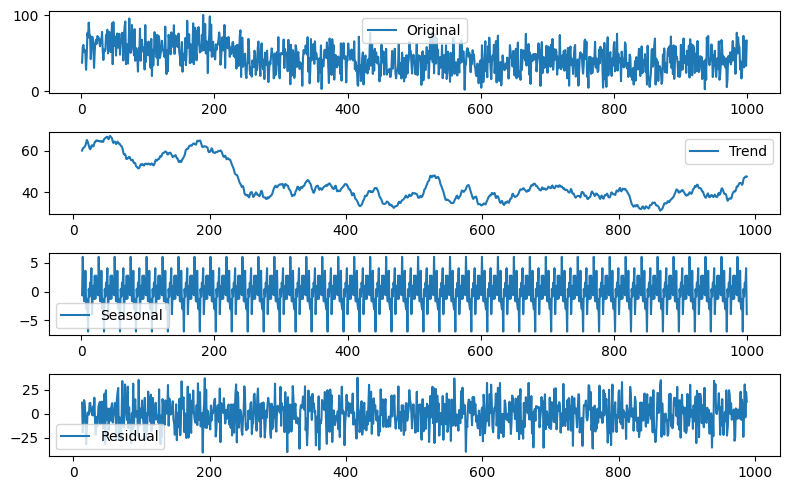

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

frequency = 12  # For example, if data is monthly, set frequency to 12

decomposition = seasonal_decompose(water_df['WaterFlow'], model='additive', period=24)
decomposition

plt.figure(figsize=(8, 5))

plt.subplot(411)
plt.plot(water_df['WaterFlow'], label='Original')
plt.legend()

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend')
plt.legend()

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.legend()

plt.subplot(414)
plt.plot(decomposition.resid, label='Residual')
plt.legend()

plt.tight_layout()
plt.show()

Since the value of labda is close to 1, we will not be applying any tranformation.

In [122]:
from scipy.stats import boxcox

# Apply Box-Cox transformation
water_trans, water_lambda = boxcox(water_df['WaterFlow'])
water_lambda

0.8082840221068853

Trying Exponential Smoothing Model with 24 hour seasonality to see the results

In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ETS model fitting
model = ExponentialSmoothing(water_df['WaterFlow'], seasonal='add', seasonal_periods=24).fit()

# Forecasting
forecast = model.forecast(steps=168)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(water_df.index, water_df['WaterFlow'], label='Actual', marker='o')
plt.plot(forecast.index, forecast.values, label='Forecast', linestyle='--', marker='o')
plt.xlabel('Date')
plt.ylabel('Water Flow')
plt.title('Water Flow Forecast using ETS')
plt.legend()
plt.grid(True)
plt.show()


,DateTime,WaterFlow_1,WaterFlow_2,WaterFlow
1,2015-10-23 01:00:00,18.852019,18.810791,37.662811
2,2015-10-23 02:00:00,15.158570,43.087025,58.245596
3,2015-10-23 03:00:00,23.078856,37.987705,61.066561
4,2015-10-23 04:00:00,15.482193,36.120379,51.602572
5,2015-10-23 05:00:00,22.725394,31.851259,54.576653
...,...,...,...,...
996,2015-12-03 12:00:00,0.000000,31.483105,31.483105
997,2015-12-03 13:00:00,0.000000,66.816731,66.816731
998,2015-12-03 14:00:00,0.000000,42.936656,42.936656
999,2015-12-03 15:00:00,0.000000,33.401326,33.401326


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



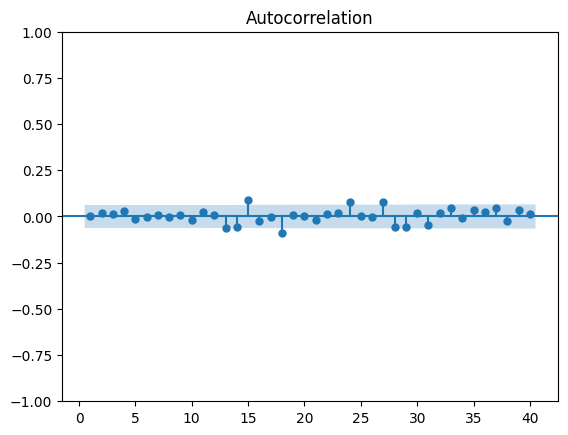

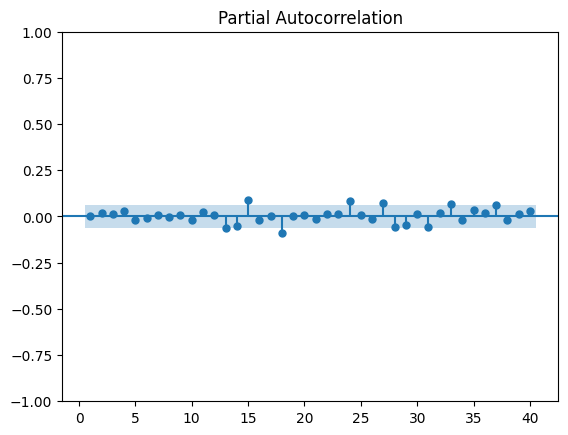

In [129]:
# water_df['DateTime'] = pd.to_datetime(water_df['DateTime'])
# water_df.set_index('DateTime', inplace=True)

# Fit ARIMA(1,1,1) model
d = ndiffs(water_df['WaterFlow'])
water_fit = ARIMA(water_df['WaterFlow'], order=(1, d, 1)).fit()

# Check residuals
residuals = water_fit.resid
acf_plot = plot_acf(residuals, lags=40, zero=False)
pacf_plot = plot_pacf(residuals, lags=40, zero=False)
plt.show()

# Forecast using ARIMA(1,1,1)
forecast = water_fit.forecast(steps=168)

# Create forecast dataframe
forecast_df = pd.DataFrame({"DateTime": pd.date_range(water_df.index.max(), periods=168, freq="H"),
                            "WaterFlow": forecast})

# Write forecast to CSV
forecast_df.to_csv("partC_output.csv", index=False)


Below I am using adfuller library get he ADF test to get the p values to check whether we can reject the null hypothesis that the time series has a unit root, indicating that it is non-stationary.
Interpretation: If the p-value of the test is below .05, then the null hypothesis is rejected, and the series is considered stationary. Here the p value is .025 which is less than .05 so we can consider our series stationary with d=0

In [139]:
from statsmodels.tsa.stattools import adfuller


adf_result = adfuller(water_df['WaterFlow'])
p_value = adf_result[1]
print("ADF test p-value for df_atm1['WaterFlow']:", p_value)




ADF test p-value for df_atm1['WaterFlow']: 0.024853653304044595


In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf


def kwh_aic(p, q, P, Q):
    model = ARIMA(water_df['WaterFlow'], order=(p, 0, q), seasonal_order=(P, 1, Q, 24))
    results = model.fit()
    return results.aic
best_model = auto_arima(water_df['WaterFlow'], seasonal=True, m=24, max_order=None, max_d=1,
                        max_p=3, max_q=1, max_P=3, max_Q=1,
                        stepwise=False, information_criterion='aic',
                        trace=True, error_action='ignore', suppress_warnings=True)

print("Best ARIMA model:", best_model.order, best_model.seasonal_order)





Here I am choosing the best model based on AIC order=(3, 1, 3), seasonal_order=(0, 0, 1, 24) from above best models and forcasting waterflow for next 1 week.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



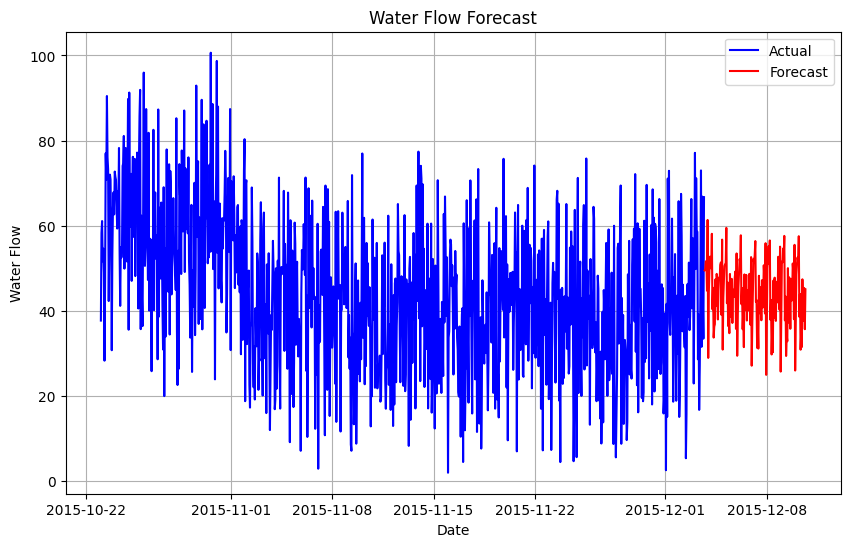

In [147]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA model
kwh_fit = ARIMA(water_df['WaterFlow'], order=(3, 0, 3), seasonal_order=(5, 2, 1, 24)).fit()

# Number of forecast steps
forecast_steps = 168

# Forecasting
forecast_values = kwh_fit.forecast(steps=forecast_steps)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(water_df.index, water_df['WaterFlow'], label='Actual', color='blue')
plt.plot(pd.date_range(start=water_df.index[-1], periods=forecast_steps+1, freq='H')[1:], forecast_values, label='Forecast', color='red')
plt.xlabel('Date')
plt.ylabel('Water Flow')
plt.title('Water Flow Forecast')
plt.legend()
plt.grid(True)
plt.show()

# Save forecast to CSV
forecast_dates = pd.date_range(start=water_df.index[-1], periods=forecast_steps+1, freq='H')[1:]
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})
forecast_df.to_csv('water_flow_forecast.csv', index=False)
